In [1]:
# load data
from choose_feature_params import \
    (ns, anatomy, 
     threshold,trunc_mag,radius,step,
     use_keys, anat_list, feature_names, 
     Kmethod, Kmeans_folder, Kmeans_inside_folder)

from datasets_info import (
    names_of_interest, levels_of_interest, paper_names_of_interest, 
    phases_of_interest, phases_labels)

import pickle
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn import mixture
import time

# load feature vectors

# load or aggregate X
PH_folder = ''
data_folder = ''
segmented_folder = ''
denoised_folder = ''

# RUN aggregate() FUNCTION EACH TIME YOU REDEFINE PARAMETERS

if use_keys == 'no_weight' :
    aux = 'noweight_nocounts'
else :
    aux = use_keys
    
X = pickle.load(open("X_both_noweight_nocounts_ns5_thr0.5_trcNone_rad40_step5.pkl", 'rb'))

nan_pixels = (np.isnan(X).sum(1) > 0)
X_no_nan = X[nan_pixels == False]

print(X_no_nan.shape)
print(np.sum(np.sum(X,axis=1)>0))

print(X.shape)

(17251155, 15)
17251155
(22177580, 15)


In [2]:
n_tot = X.shape[0]
n_reduced = X_no_nan.shape[0]
print([n_tot, n_reduced])

[22177580, 17251155]


In [3]:
ns = 5
slic = 2

filepath = 'dico_bonemap_sizes_thr{}_trc{}_rad{}_step{}.pkl' \
.format(threshold,trunc_mag,radius,step)
dico_bonemap_sizes = pickle.load(open(filepath, 'rb'))

filepath = 'dico_starting_index_thr{}_trc{}_rad{}_step{}.pkl' \
.format(threshold,trunc_mag,radius,step)
dico_starting_index = pickle.load(open(filepath, 'rb'))

filepath = 'dico_excl_ending_index_thr{}_trc{}_rad{}_step{}.pkl' \
.format(threshold,trunc_mag,radius,step)
dico_excl_ending_index = pickle.load(open(filepath, 'rb'))

print('loaded three dicos')

loaded three dicos


In [4]:
from matplotlib.colors import LinearSegmentedColormap
import matplotlib
import matplotlib.pyplot as plt
from datasets_info import datasets_of_interest
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import pandas as pd
from sklearn.decomposition import PCA

def show_percentages(df, anatomy, ax = None, xlabel = 'dataset') :    
    # plot a Stacked Bar Chart using matplotlib
    df.plot(
      x = xlabel, # name of column ['WT','KO'] 
      kind = 'barh', 
      stacked = True, 
      title = 'Cluster distribution within {} samples'.format(anatomy), 
      mark_right = True,
      ax = ax, cmap = cmap_d)
    if n_clusters == 3 : ax.legend(['A','B','C'])
    df_total = sum( [ df[lab] for lab in unique_labels ]) # total nb per line
    df_rel = df[df.columns[1:]].div(df_total, 0)*100
    #print(df_total)
    #print(df_rel)

    for n in df_rel: 
        # n is cluster number
        # in each bar on line i,
        # cs is horizontal coordinate of end of chunk
        # ab is width of color chunk
        for i, (cs, ab, percent) in enumerate(zip(df.iloc[:, 1:].cumsum(1)[n], df[n], df_rel[n])):
            #print(i, (cs, ab, percent))
            percent_col = 'k'
            if n_clusters == 3 :# and cs > 0.99: # trick for paper fig
                if n in [1] : percent_col = 'w'
                    
            if n_clusters == 10 :
                if n in [0,1,2,7,8,9] : percent_col = 'w'
            
            plt.text(cs - ab / 2, i, str(np.round(percent, 1)) + '%', 
                     va = 'center', ha = 'center', fontsize = 9, color = percent_col)
            
def show_percentages2(df, ax = None, xlabel = 'dataset') :    
    # plot a Stacked Bar Chart using matplotlib
    df.plot(
      x = xlabel, # name of column ['WT','KO'] 
      kind = 'barh', 
      stacked = False, 
      title = 'Cluster distribution within samples', 
      mark_right = True,
        ax = ax)

# add in colours for different phases
from datasets_info import (phases_of_interest, paper_names_of_interest)
label_colours = []
for i in phases_of_interest:
    if i == 0:
        label_colours.append("green")
    elif i == 1:
        label_colours.append("orange")
    else:
        label_colours.append("red")
        
# determine function to set cmap
def set_cmap(n_clusters):
    if n_clusters == 3 :
        #cmap_d = matplotlib.cm.Blues
        # this order: Texture A, Texture B, Texture C for CTRL, EARLY, LATE
        colors_1 = [(0.9686274509803922, 0.984313725490196, 1.0), # nearly white
                  (0.03137254901960784, 0.18823529411764706, 0.4196078431372549), # dark blue
                 (0.41708573625528644, 0.6806305267204922, 0.8382314494425221) # light blue
                 ]
        colors_2 = ['#e6f3ff',
                    '#661f1f',
                    '#fcb053'
             ]
        cmap_d = LinearSegmentedColormap.from_list('my_cmap', colors_1, N=3)

    elif n_clusters == 10 :
        cmap_d = matplotlib.cm.RdBu_r # summer
    else:
        cmap_d = matplotlib.cm.RdBu_r
    cmap_d.set_bad('yellow',.15)
    return cmap_d

/var/tmp/pbs.8604430.pbs/ipykernel_3565953/1367108732.py:81: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu_r").copy()
  cmap_d.set_bad('yellow',.15)


gmm_clusterplots/clustermaps_knee_2gmmclust.png


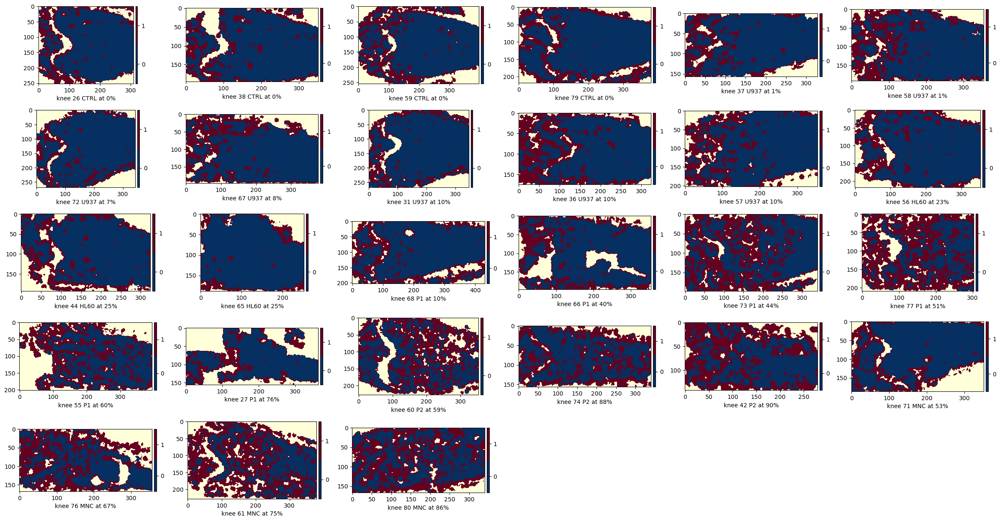

gmm_clusterplots/clustermaps_long_2gmmclust.png


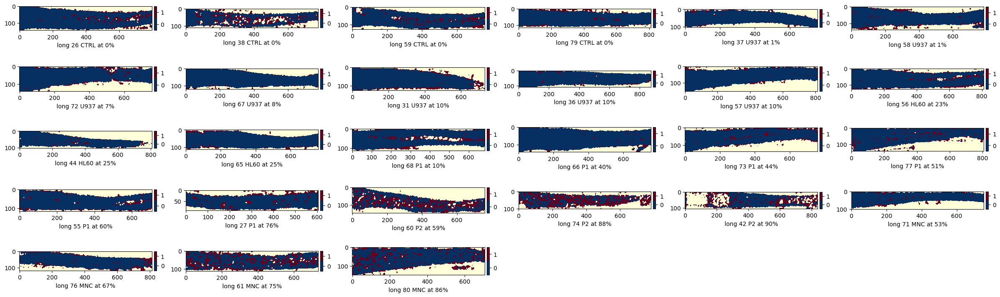

gmm_clusterplots/percentages_both_2gmmclust.png


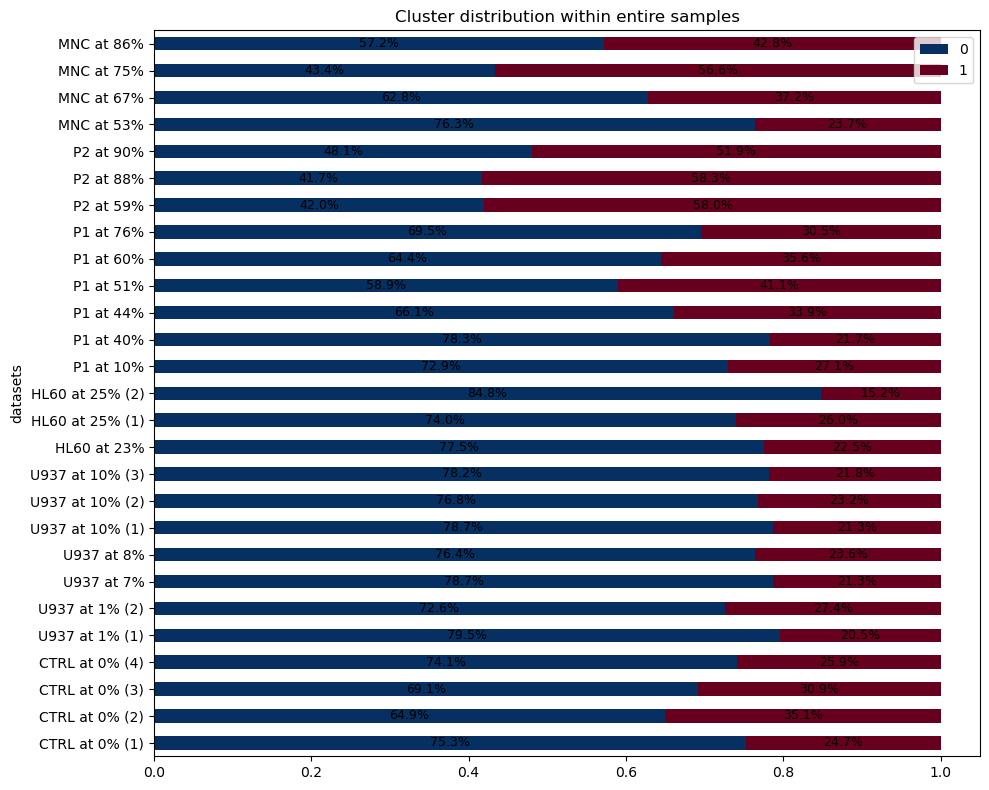

gmm_clusterplots/percentages_knee_2gmmclust.png


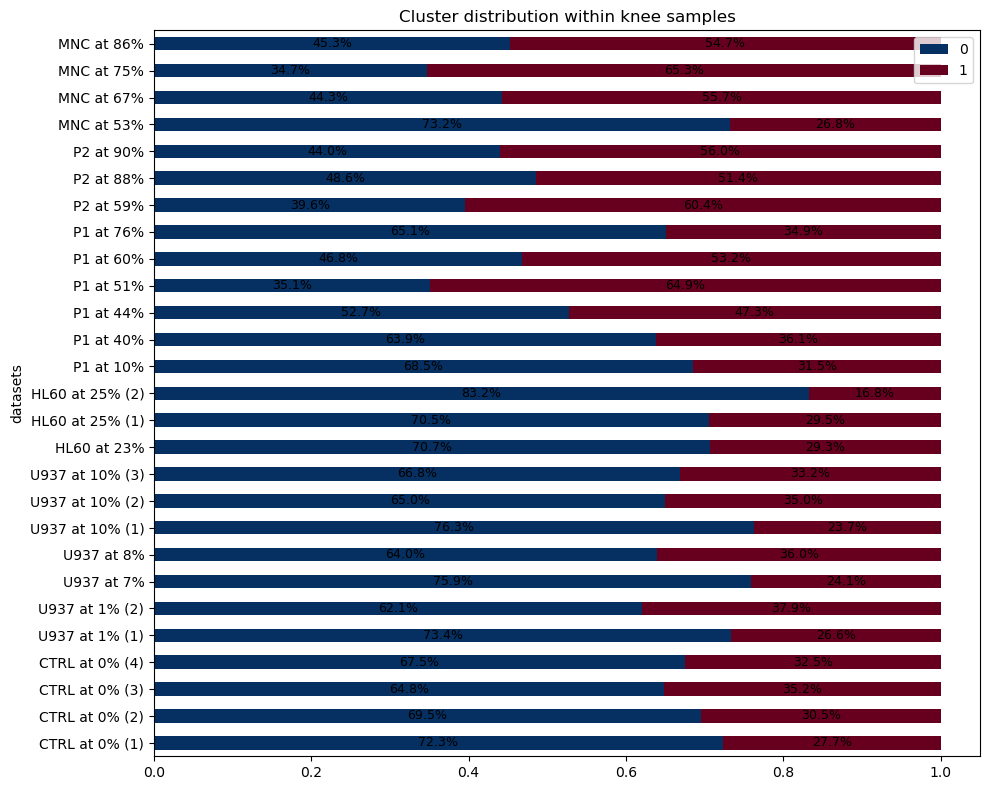

gmm_clusterplots/percentages_long_2gmmclust.png


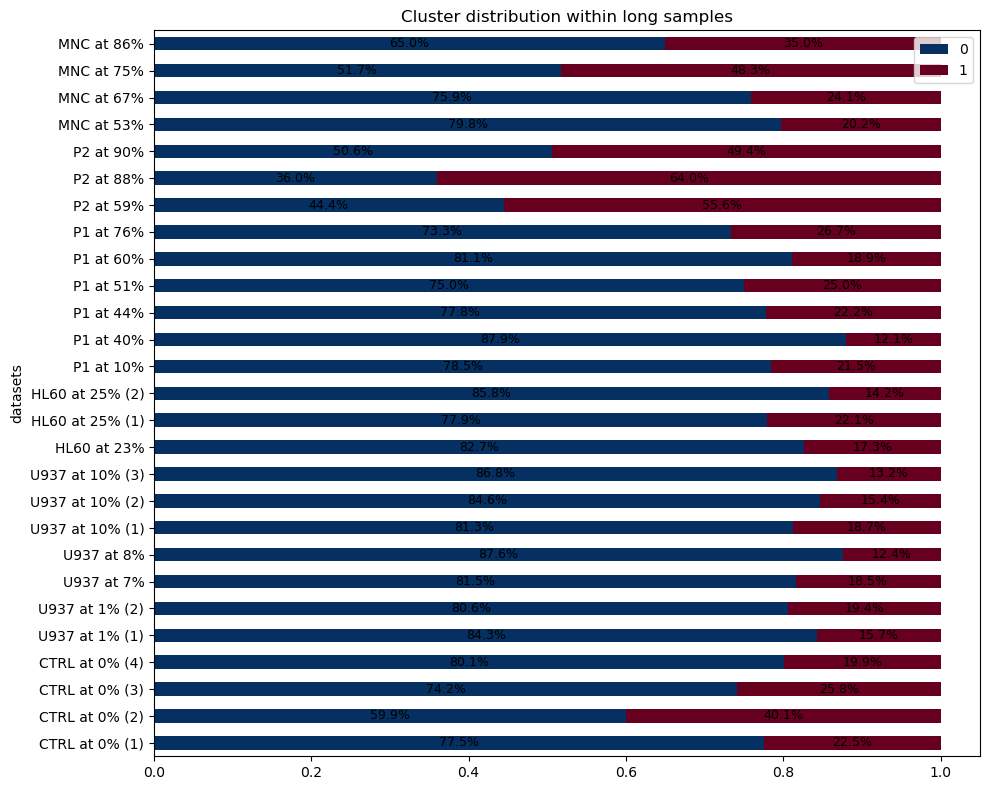

gmm_clusterplots/pca_knee_2gmmclust.png


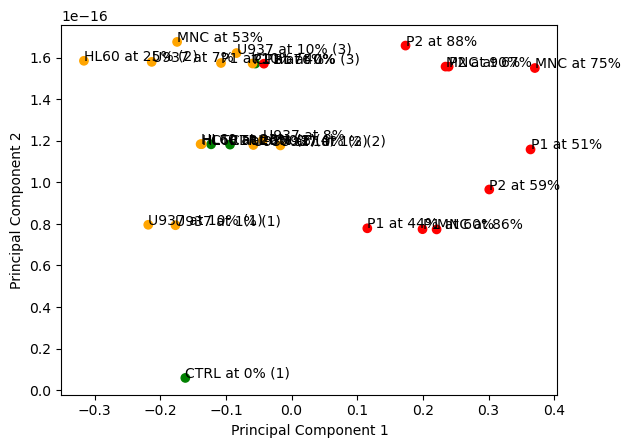

gmm_clusterplots/pca_knee_2gmmclust_withlegend.png


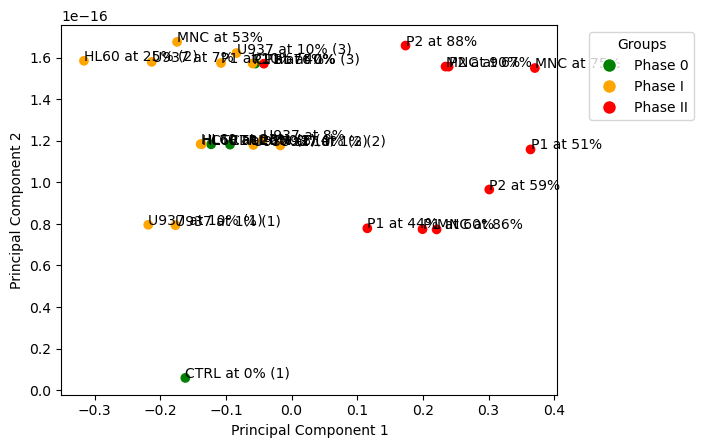

gmm_clusterplots/clustermaps_knee_3gmmclust.png


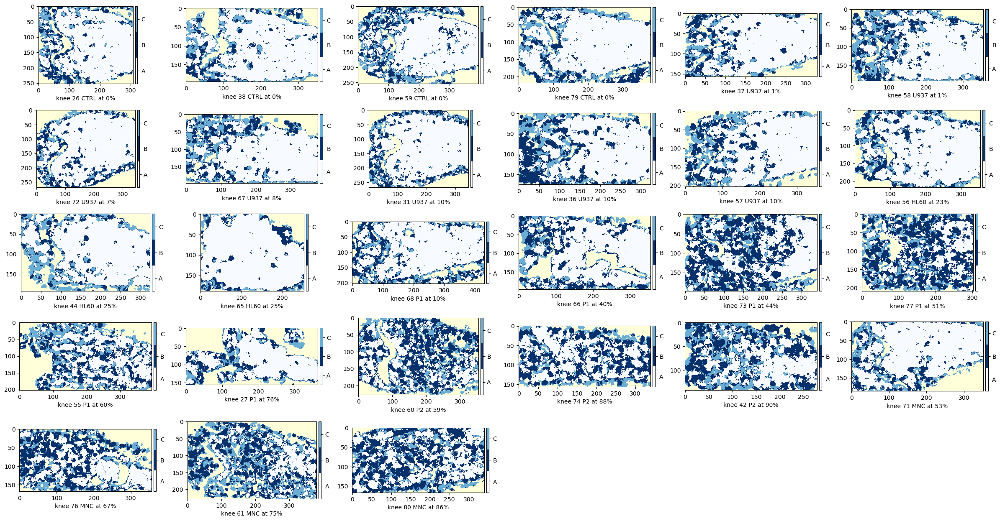

gmm_clusterplots/clustermaps_long_3gmmclust.png


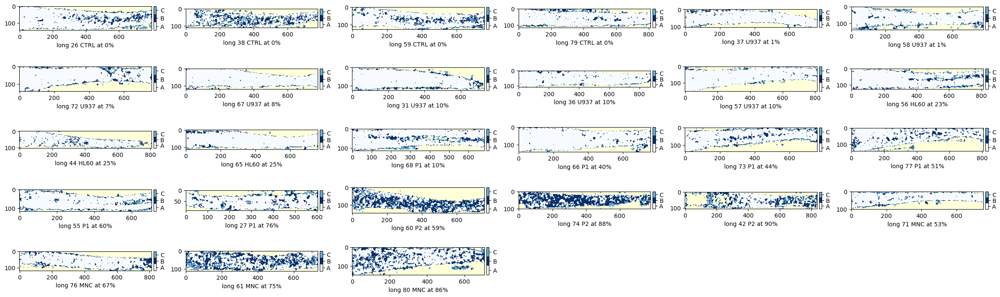

gmm_clusterplots/percentages_both_3gmmclust.png


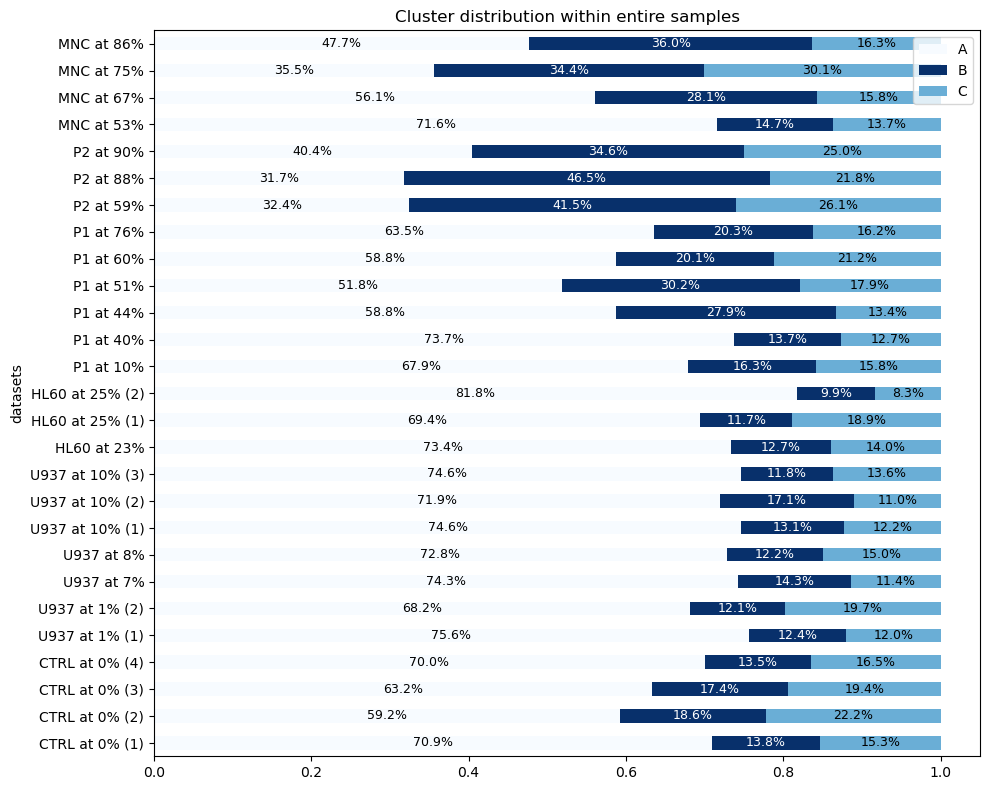

gmm_clusterplots/percentages_knee_3gmmclust.png


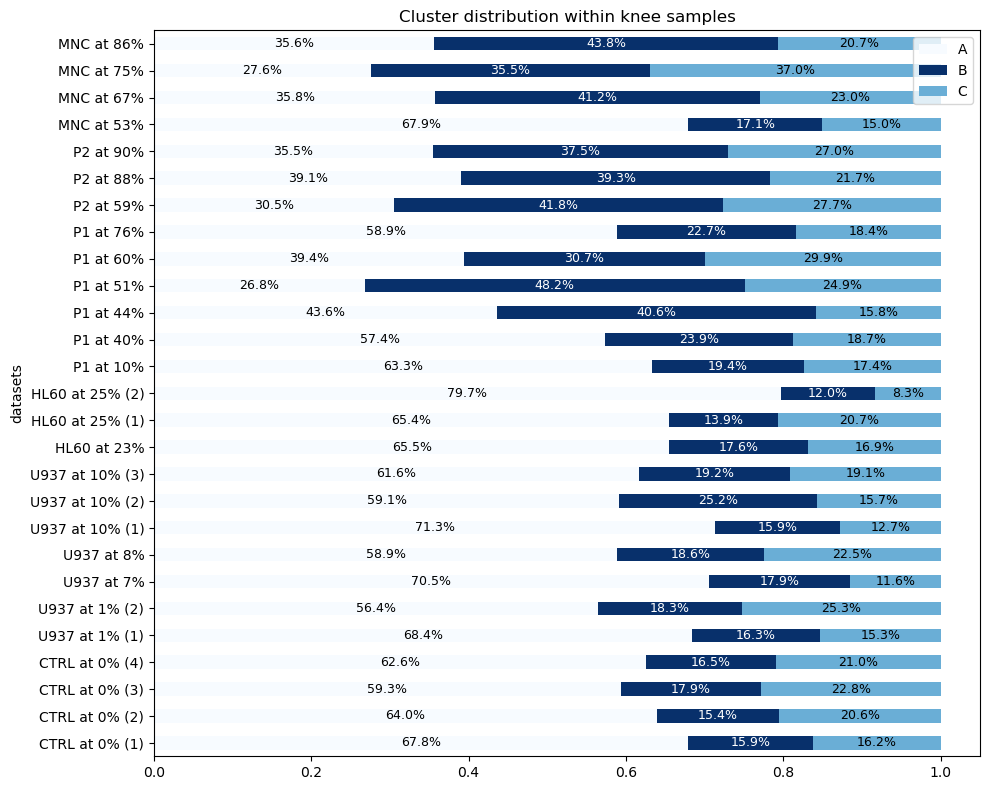

gmm_clusterplots/percentages_long_3gmmclust.png


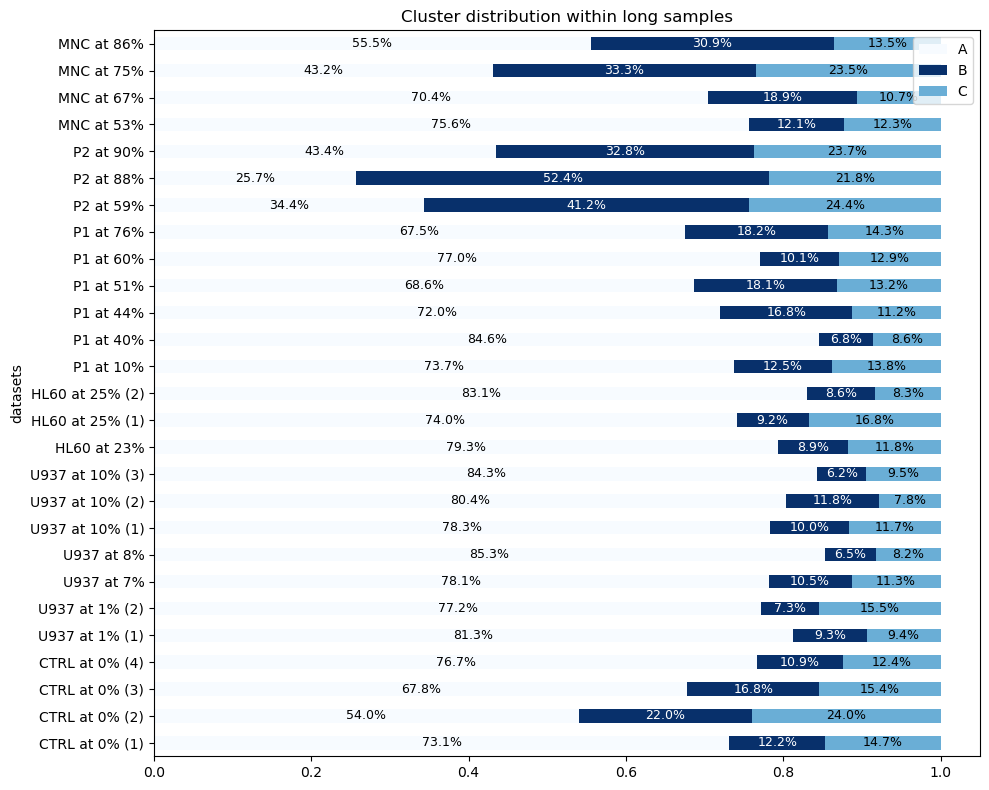

gmm_clusterplots/pca_knee_3gmmclust.png


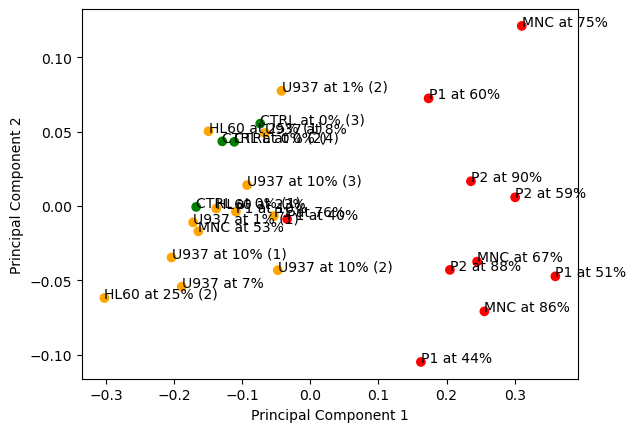

gmm_clusterplots/pca_knee_3gmmclust_withlegend.png


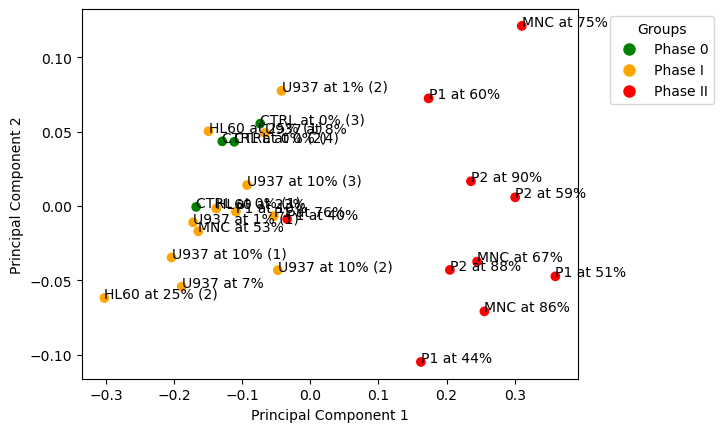

/var/tmp/pbs.8604430.pbs/ipykernel_3565953/1367108732.py:81: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu_r").copy()
  cmap_d.set_bad('yellow',.15)


gmm_clusterplots/clustermaps_knee_4gmmclust.png


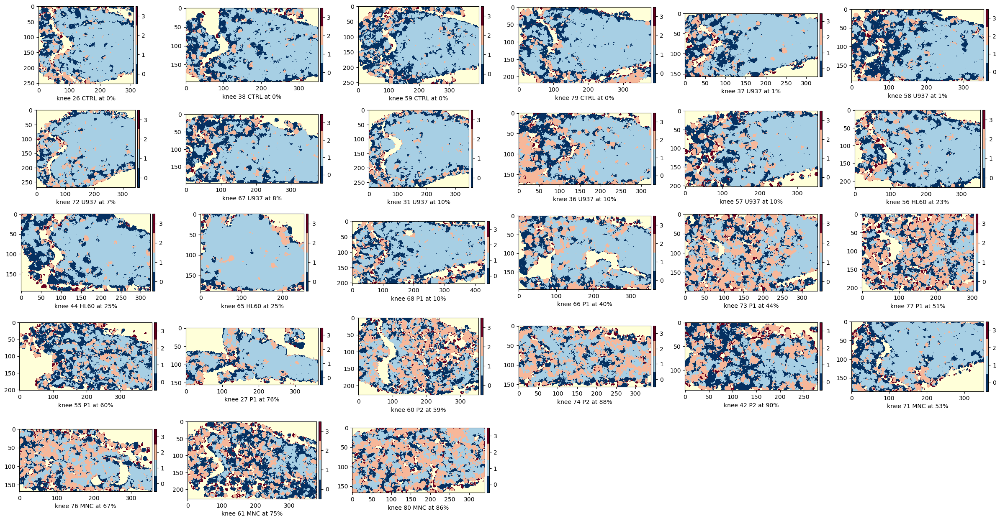

gmm_clusterplots/clustermaps_long_4gmmclust.png


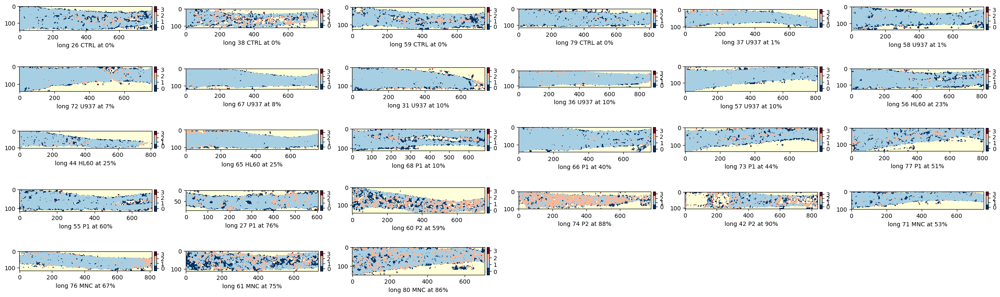

gmm_clusterplots/percentages_both_4gmmclust.png


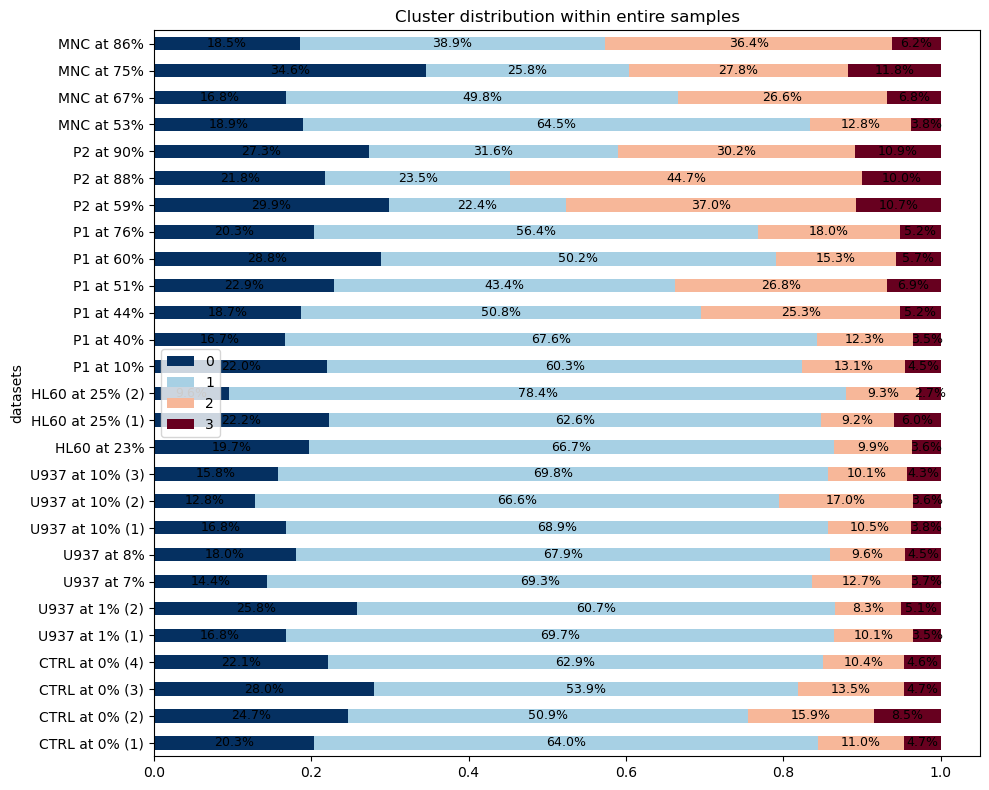

gmm_clusterplots/percentages_knee_4gmmclust.png


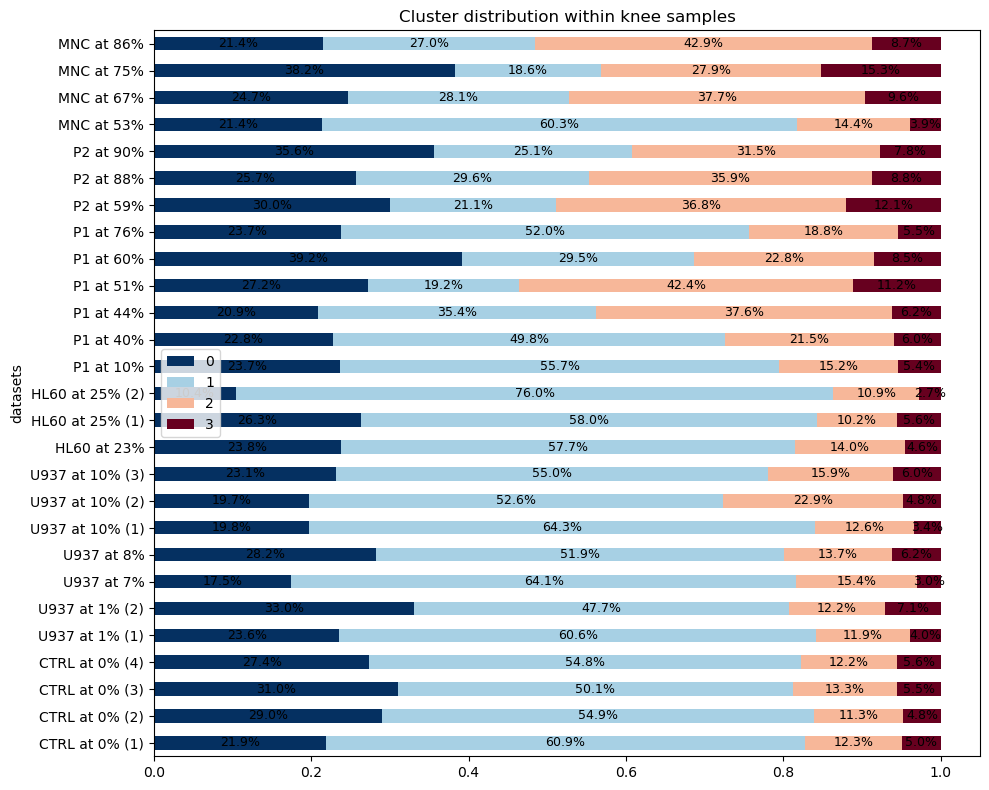

gmm_clusterplots/percentages_long_4gmmclust.png


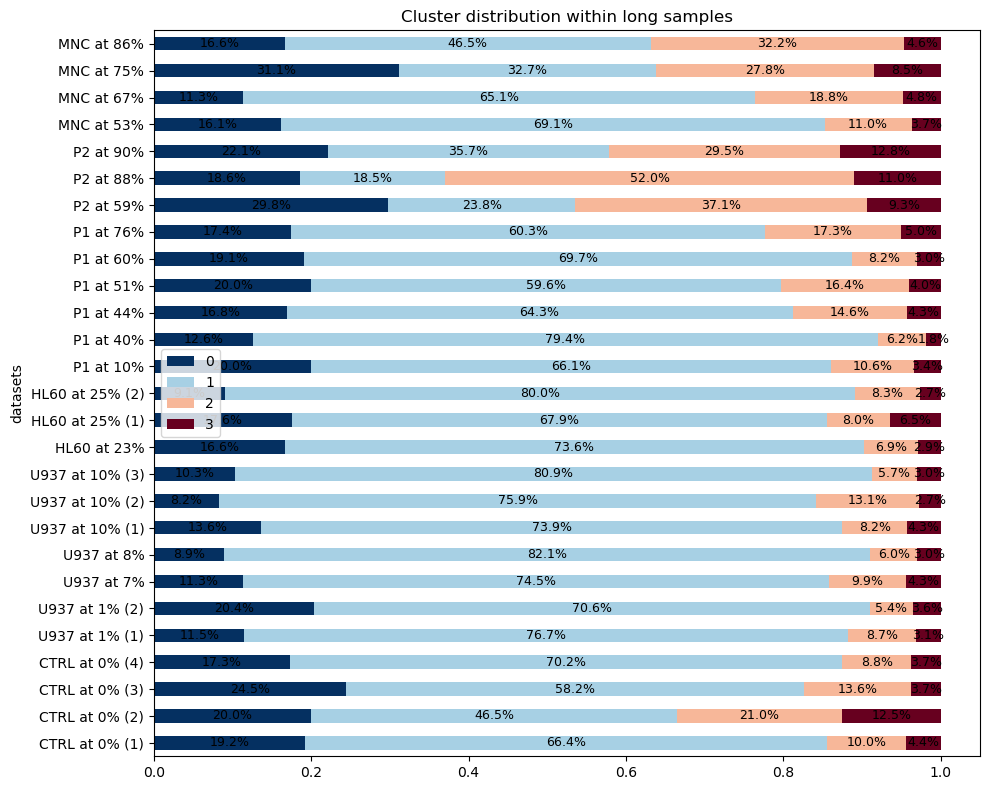

gmm_clusterplots/pca_knee_4gmmclust.png


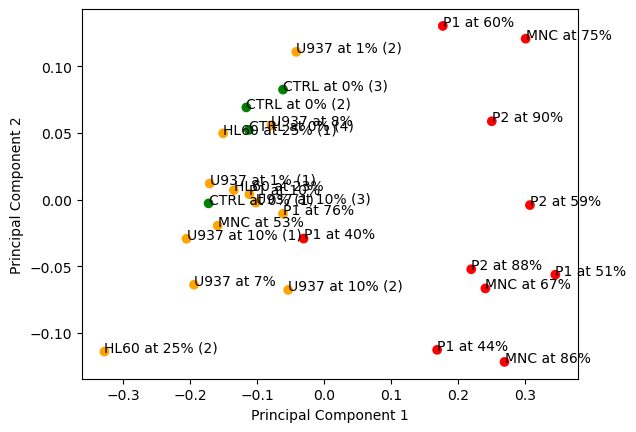

gmm_clusterplots/pca_knee_4gmmclust_withlegend.png


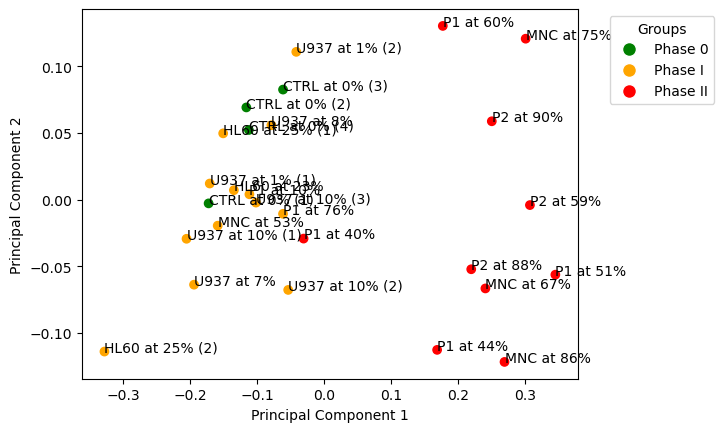

/var/tmp/pbs.8604430.pbs/ipykernel_3565953/1367108732.py:81: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu_r").copy()
  cmap_d.set_bad('yellow',.15)


gmm_clusterplots/clustermaps_knee_5gmmclust.png


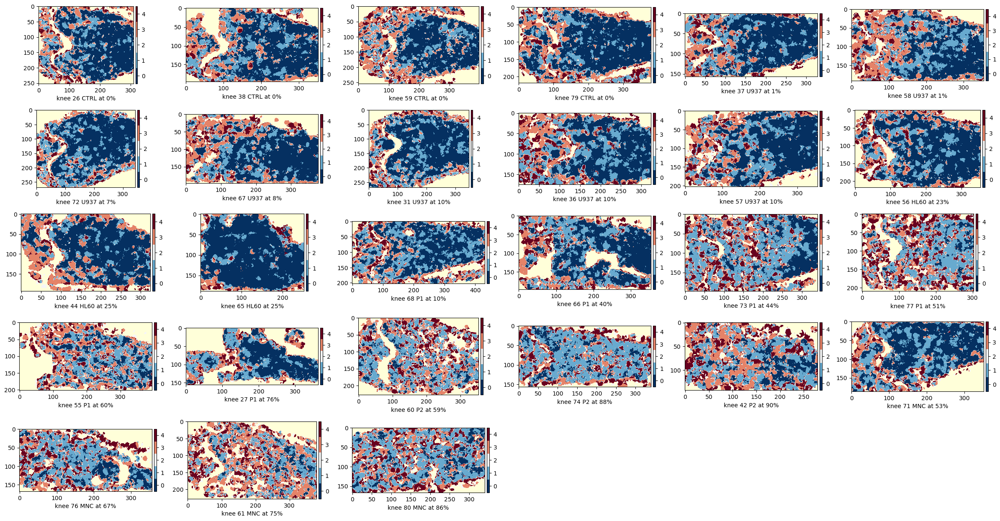

gmm_clusterplots/clustermaps_long_5gmmclust.png


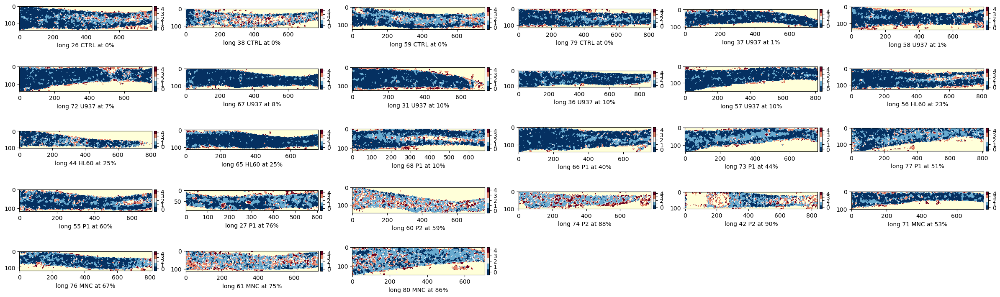

gmm_clusterplots/percentages_both_5gmmclust.png


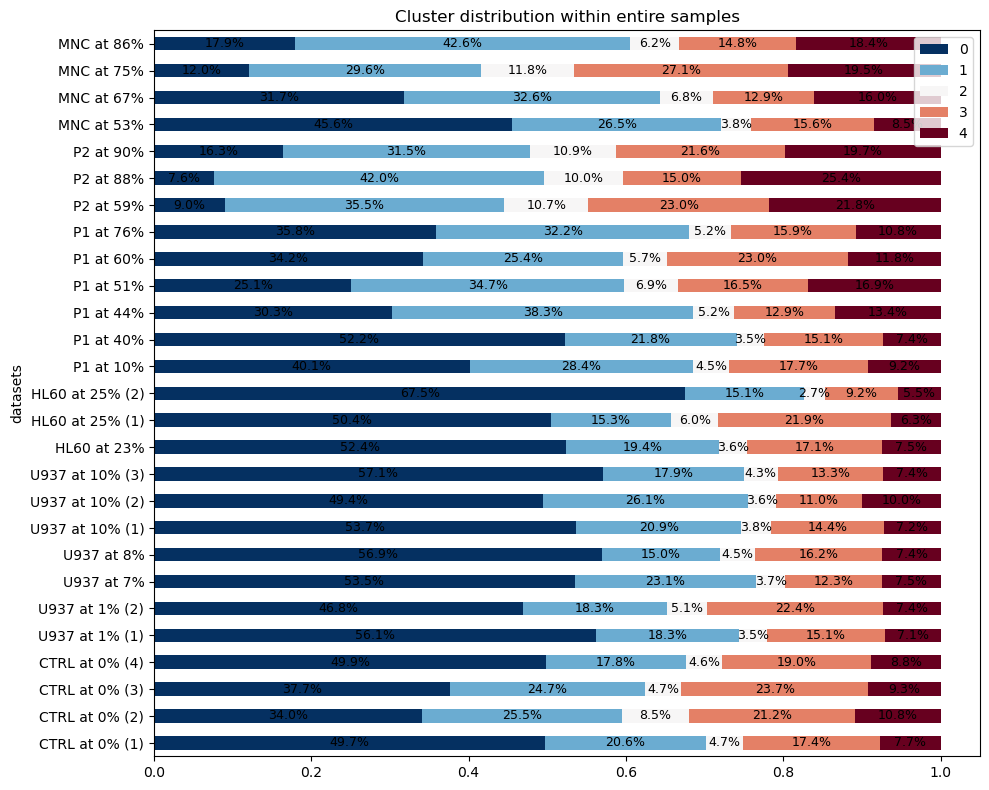

gmm_clusterplots/percentages_knee_5gmmclust.png


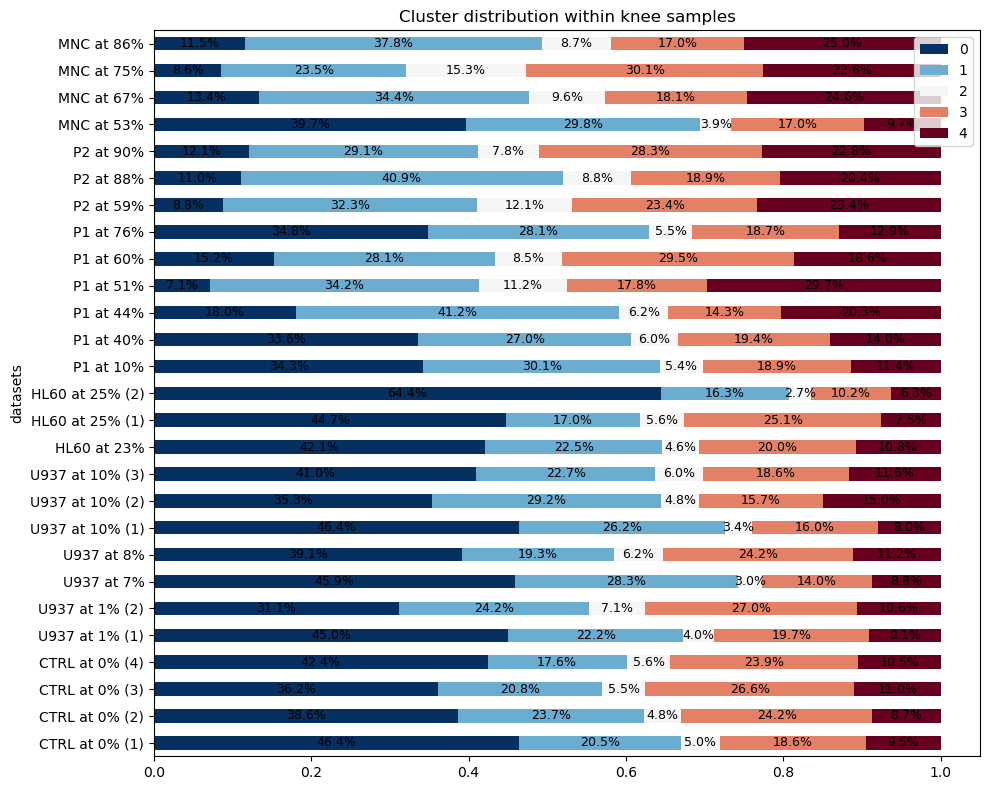

gmm_clusterplots/percentages_long_5gmmclust.png


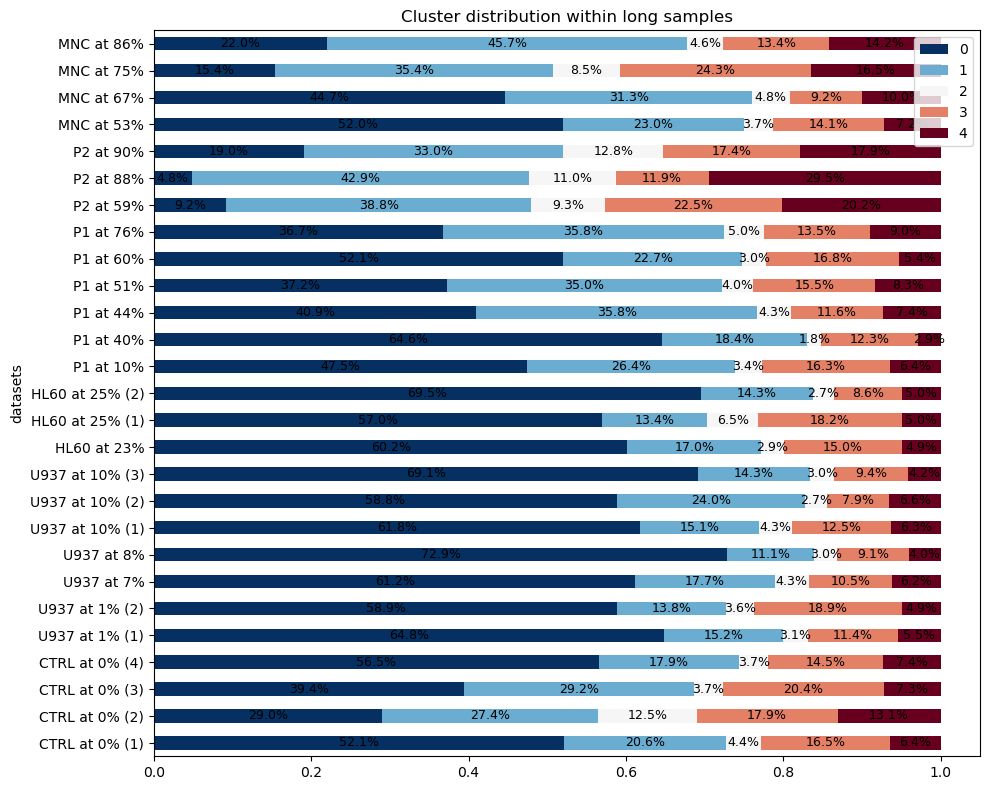

gmm_clusterplots/pca_knee_5gmmclust.png


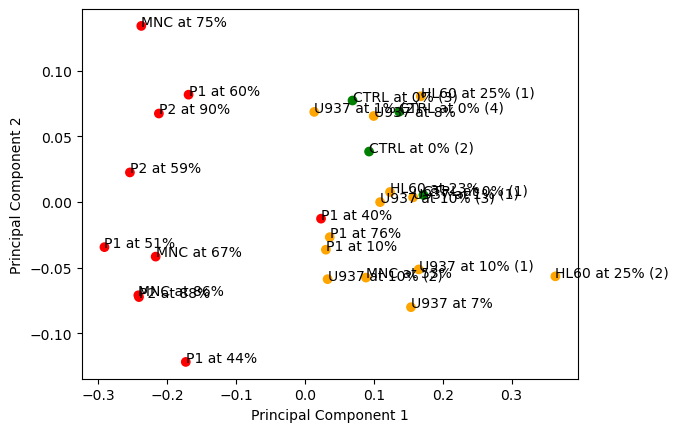

gmm_clusterplots/pca_knee_5gmmclust_withlegend.png


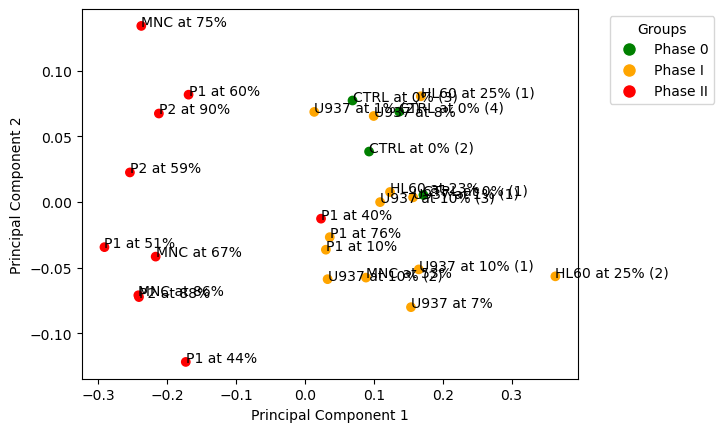

/var/tmp/pbs.8604430.pbs/ipykernel_3565953/1367108732.py:81: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu_r").copy()
  cmap_d.set_bad('yellow',.15)


gmm_clusterplots/clustermaps_knee_6gmmclust.png


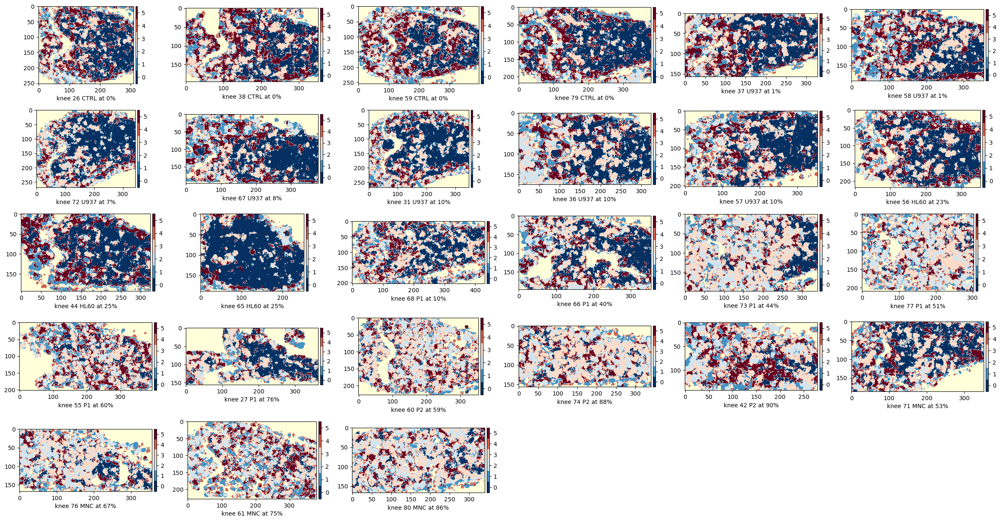

gmm_clusterplots/clustermaps_long_6gmmclust.png


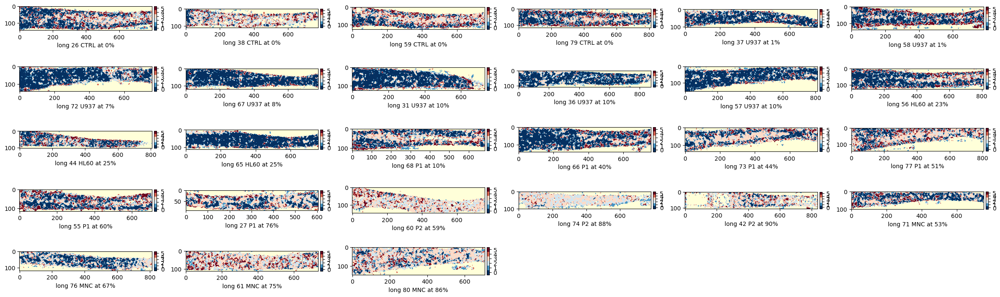

gmm_clusterplots/percentages_both_6gmmclust.png


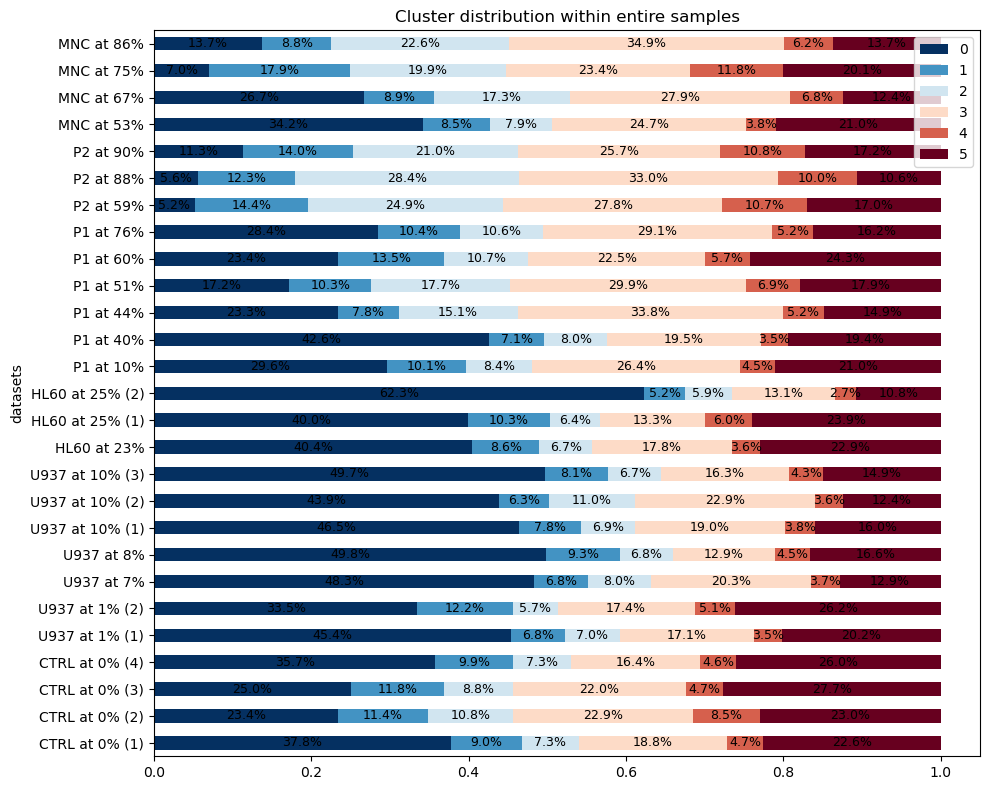

gmm_clusterplots/percentages_knee_6gmmclust.png


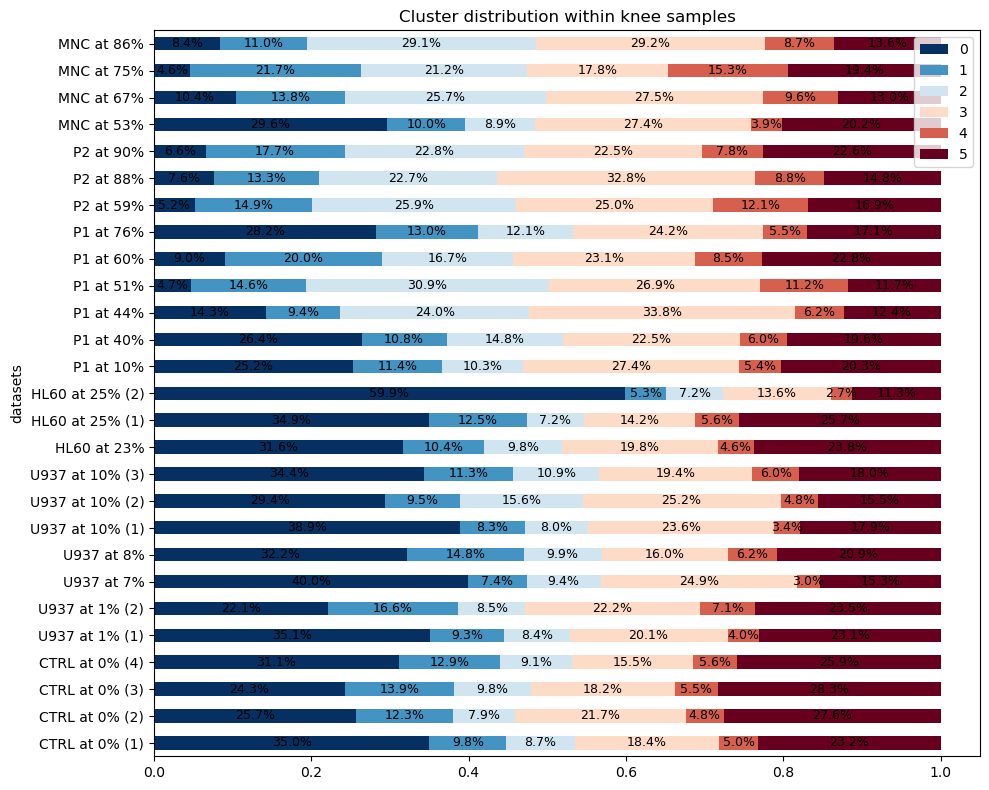

gmm_clusterplots/percentages_long_6gmmclust.png


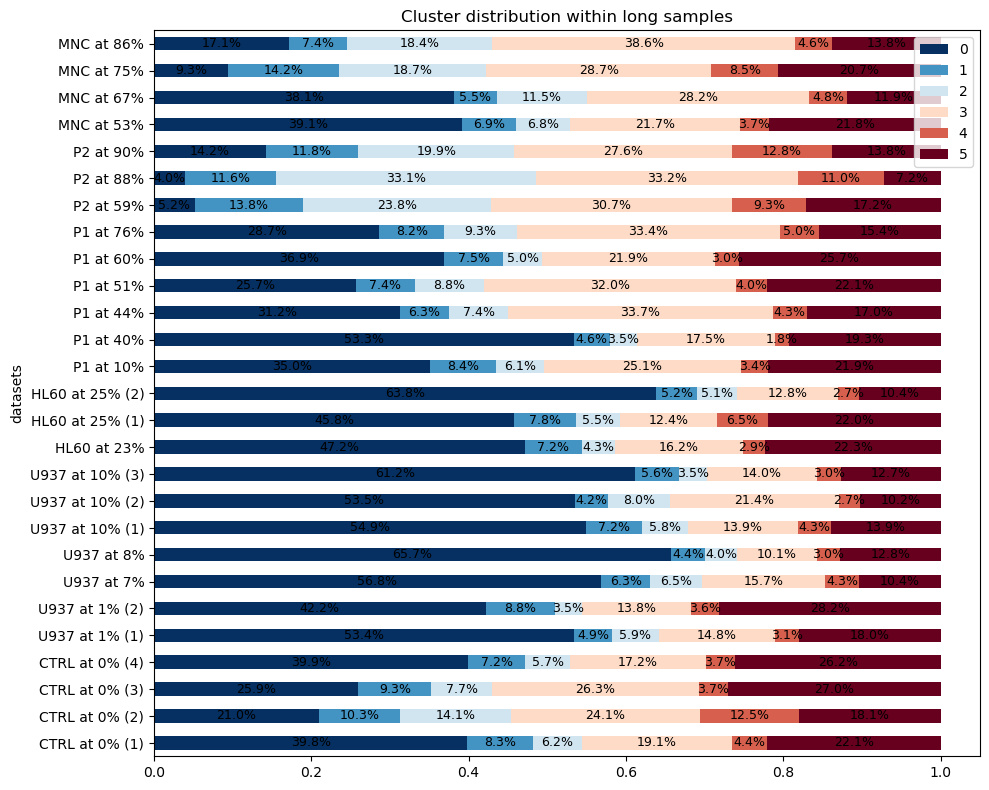

gmm_clusterplots/pca_knee_6gmmclust.png


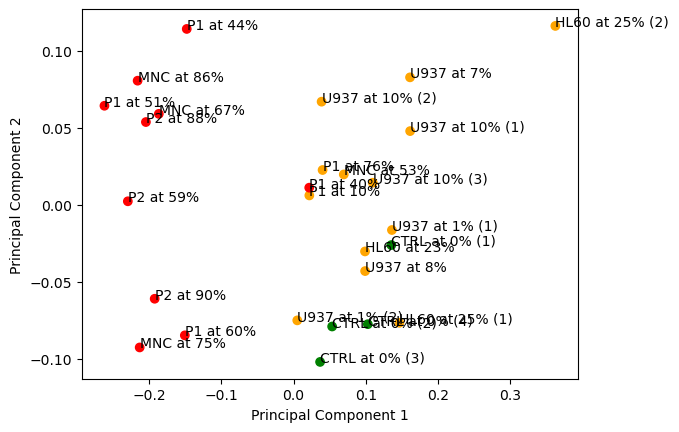

gmm_clusterplots/pca_knee_6gmmclust_withlegend.png


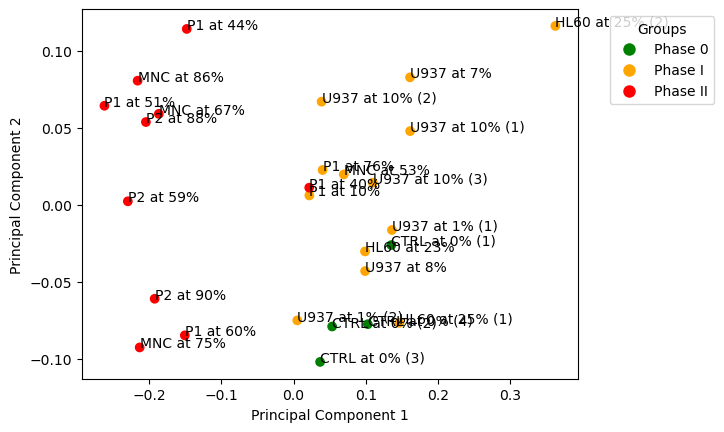

/var/tmp/pbs.8604430.pbs/ipykernel_3565953/1367108732.py:81: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu_r").copy()
  cmap_d.set_bad('yellow',.15)


gmm_clusterplots/clustermaps_knee_7gmmclust.png


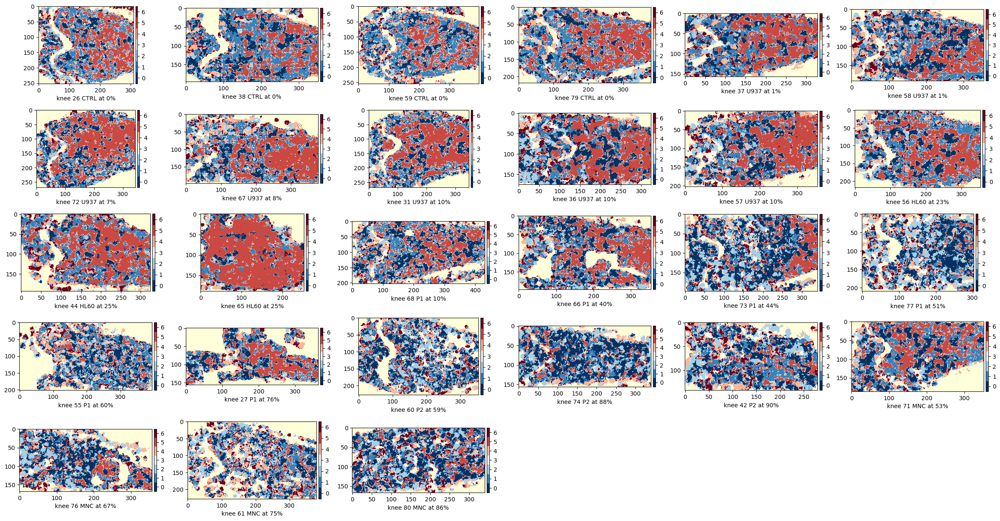

gmm_clusterplots/clustermaps_long_7gmmclust.png


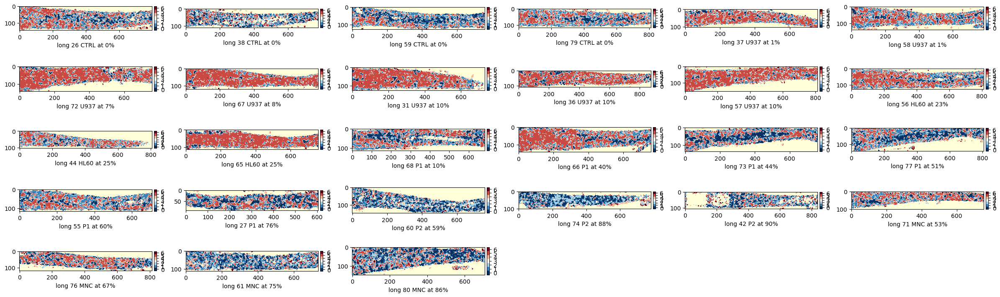

gmm_clusterplots/percentages_both_7gmmclust.png


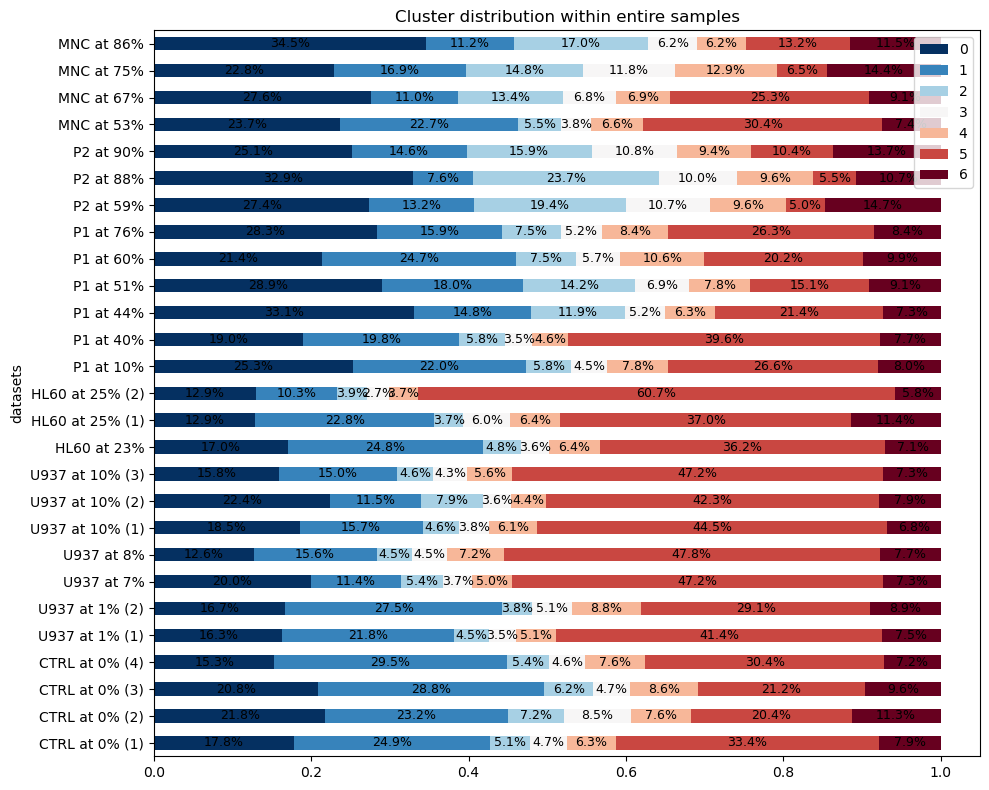

gmm_clusterplots/percentages_knee_7gmmclust.png


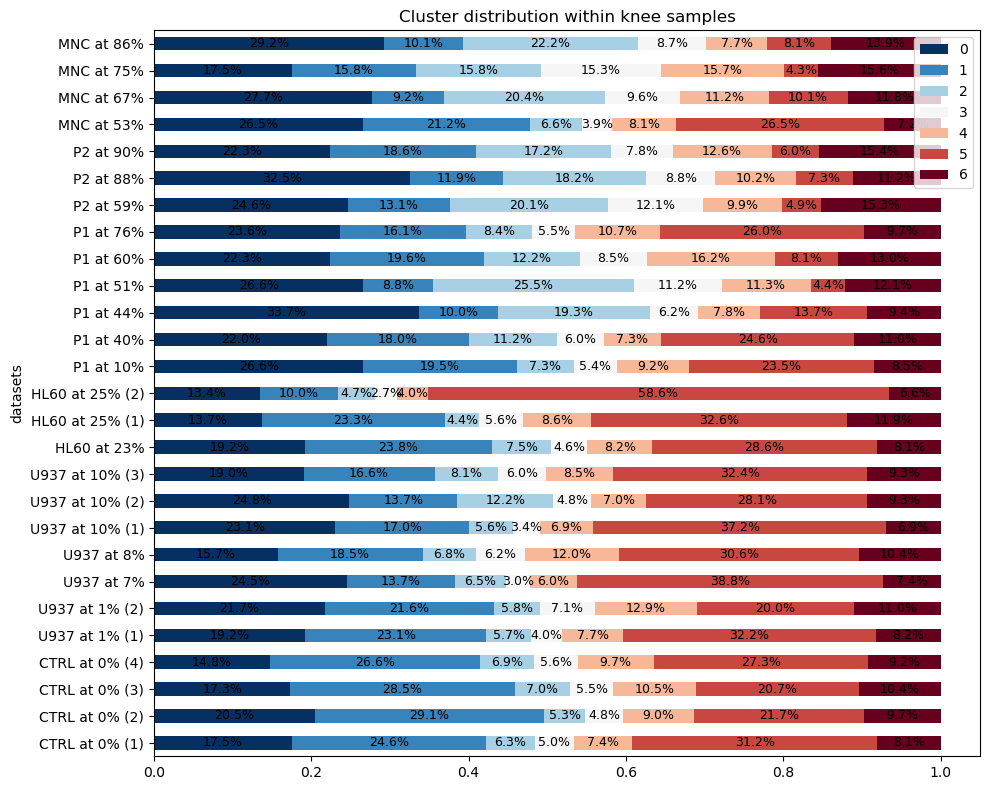

gmm_clusterplots/percentages_long_7gmmclust.png


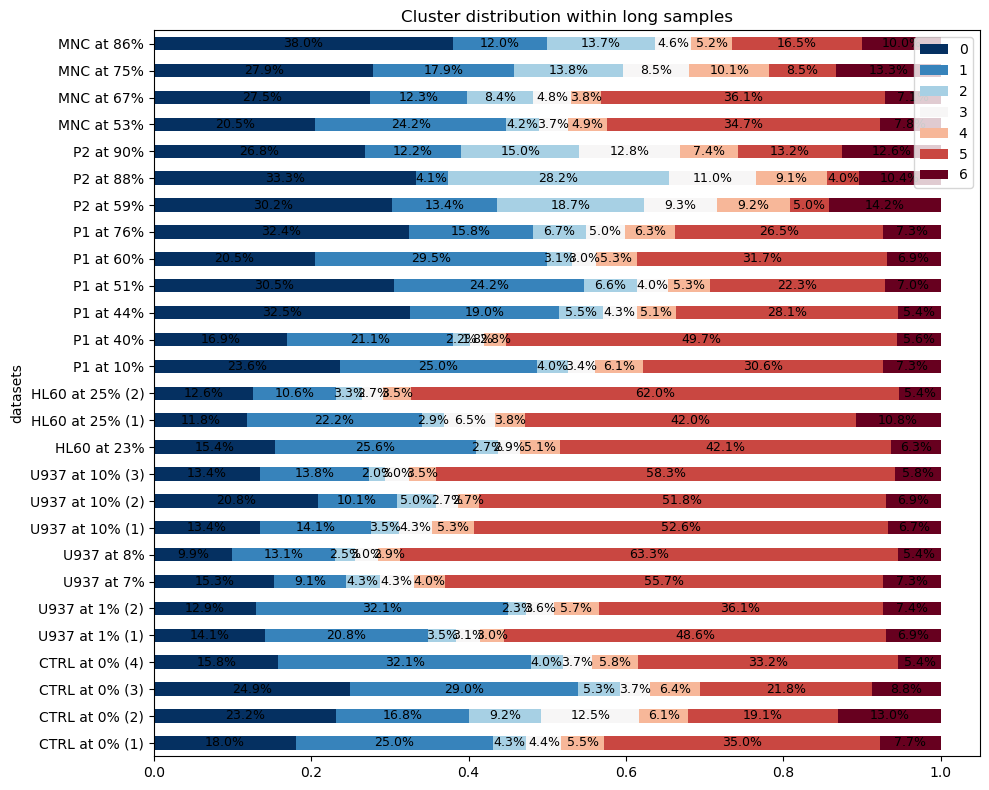

gmm_clusterplots/pca_knee_7gmmclust.png


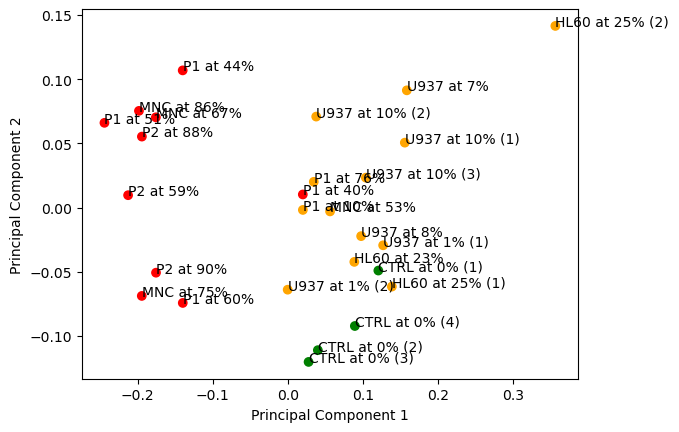

gmm_clusterplots/pca_knee_7gmmclust_withlegend.png


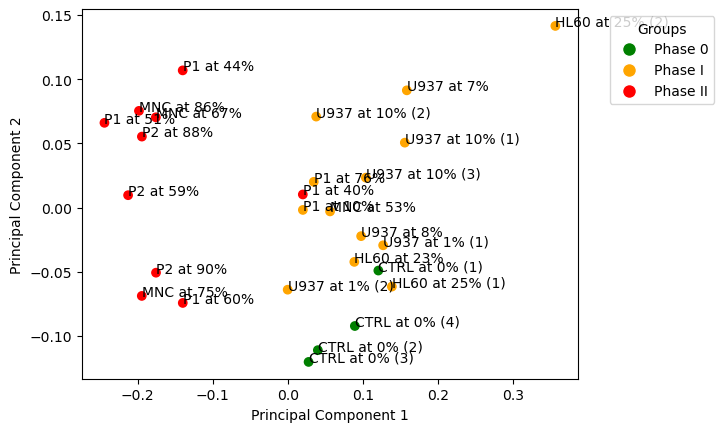

/var/tmp/pbs.8604430.pbs/ipykernel_3565953/1367108732.py:81: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu_r").copy()
  cmap_d.set_bad('yellow',.15)


gmm_clusterplots/clustermaps_knee_8gmmclust.png


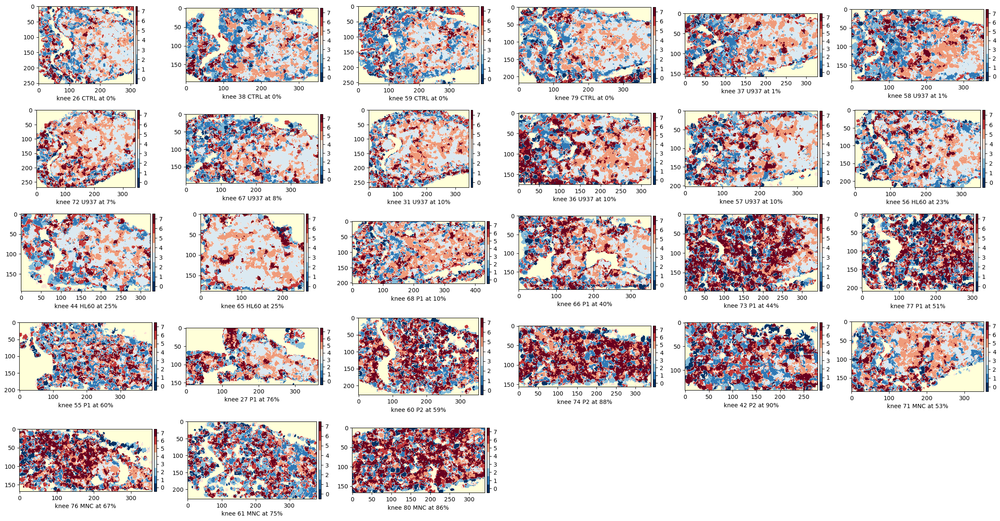

gmm_clusterplots/clustermaps_long_8gmmclust.png


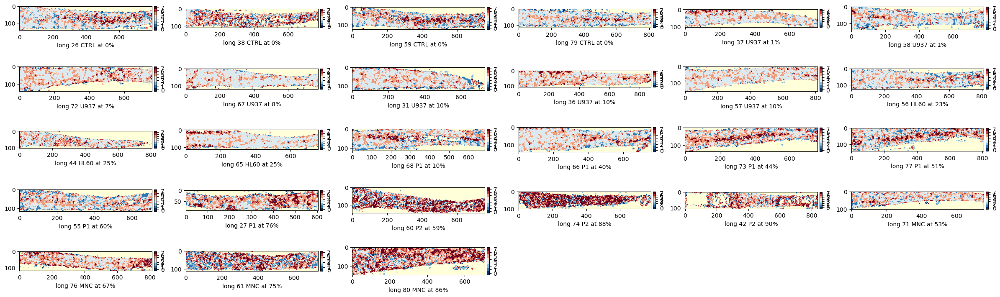

gmm_clusterplots/percentages_both_8gmmclust.png


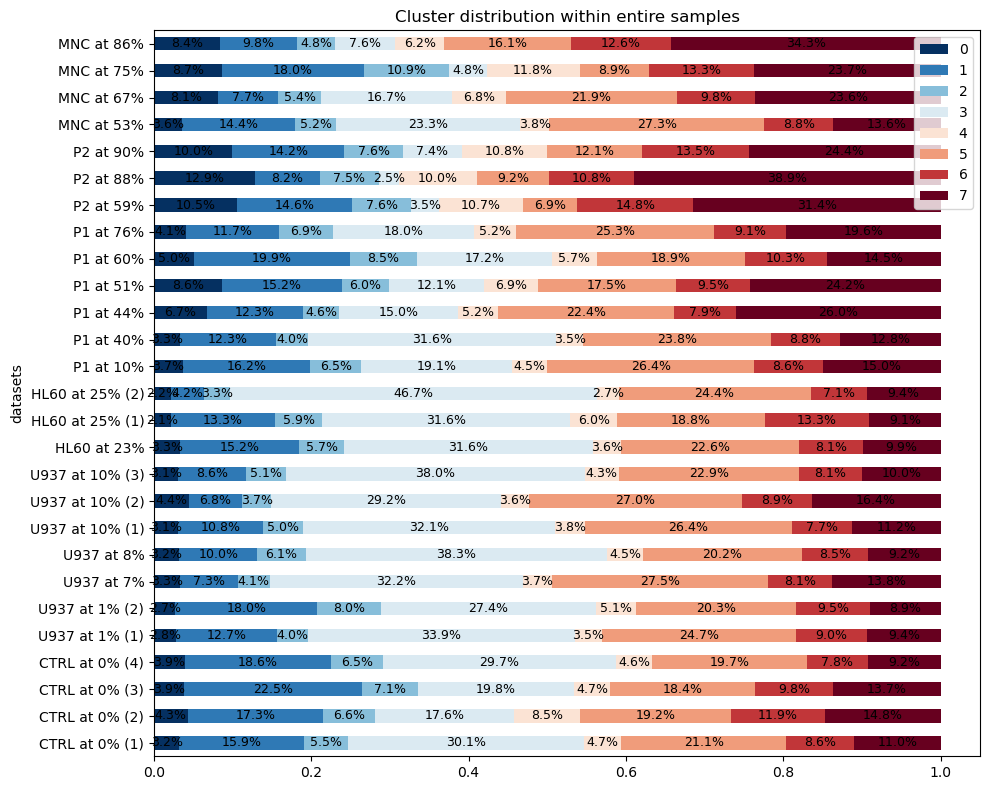

gmm_clusterplots/percentages_knee_8gmmclust.png


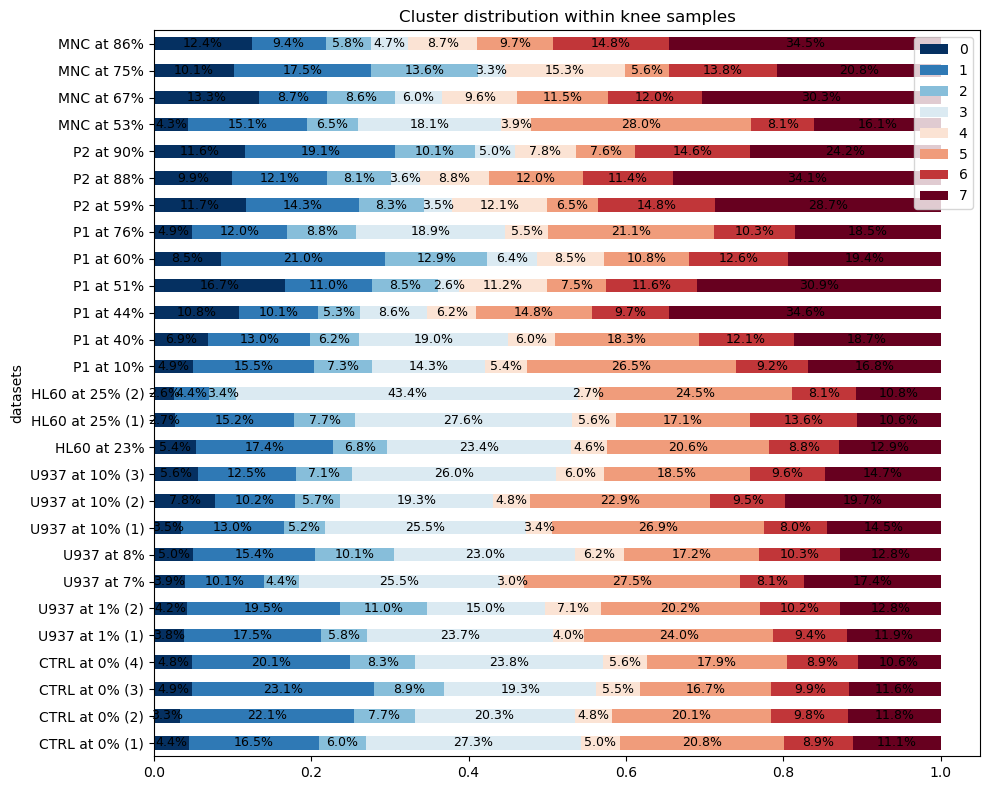

gmm_clusterplots/percentages_long_8gmmclust.png


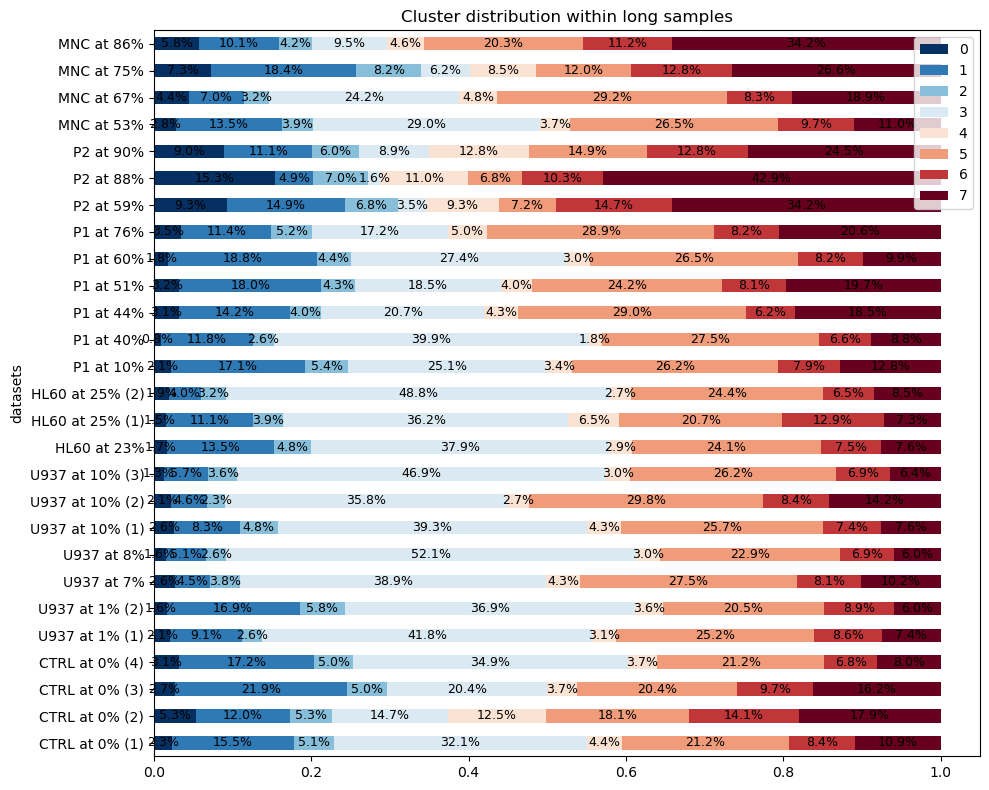

gmm_clusterplots/pca_knee_8gmmclust.png


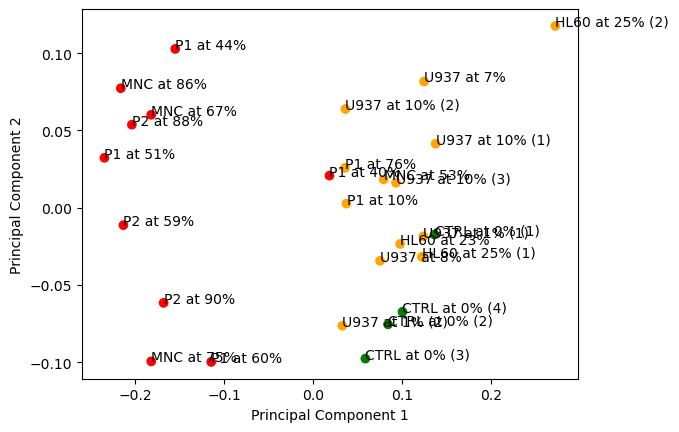

gmm_clusterplots/pca_knee_8gmmclust_withlegend.png


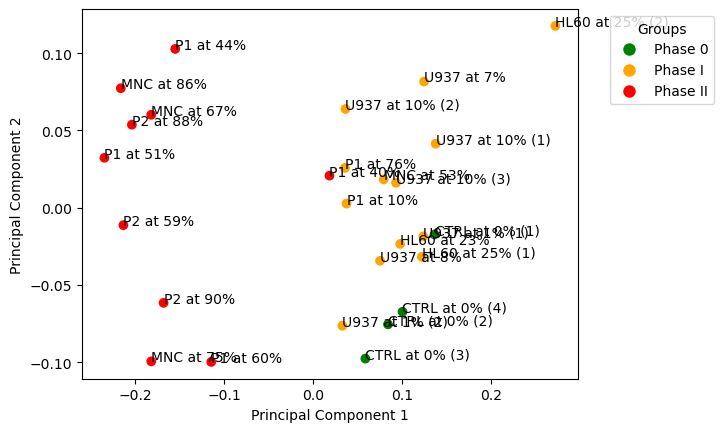

/var/tmp/pbs.8604430.pbs/ipykernel_3565953/1367108732.py:81: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu_r").copy()
  cmap_d.set_bad('yellow',.15)


gmm_clusterplots/clustermaps_knee_9gmmclust.png


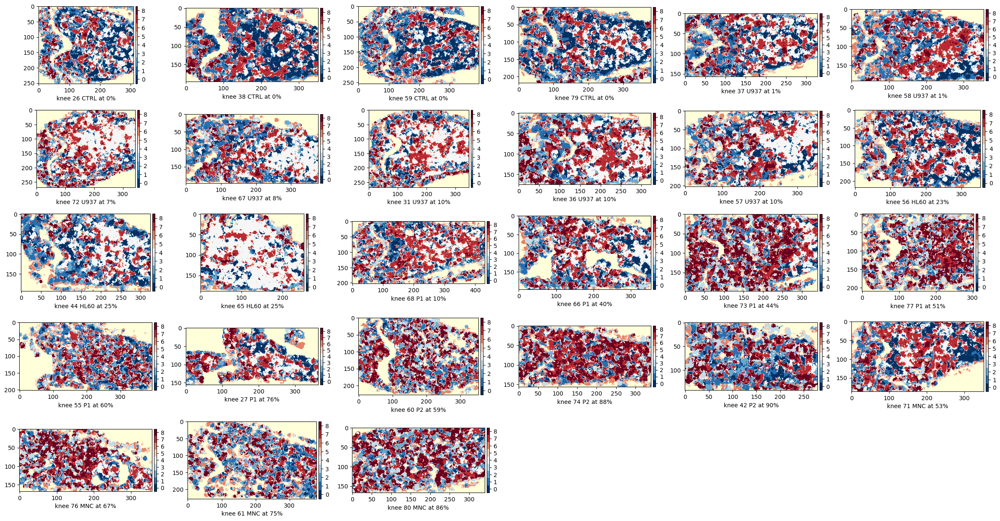

gmm_clusterplots/clustermaps_long_9gmmclust.png


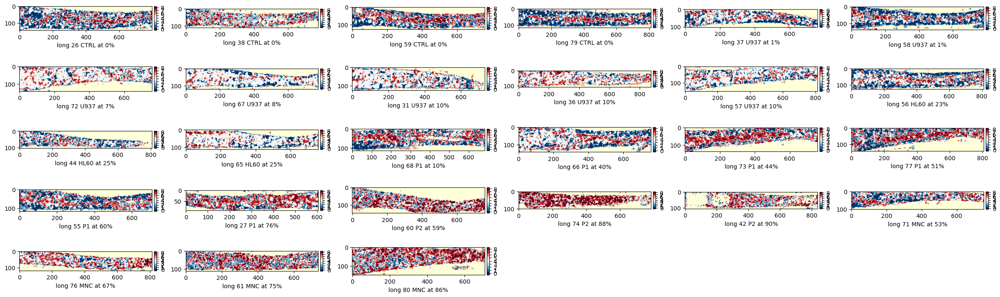

gmm_clusterplots/percentages_both_9gmmclust.png


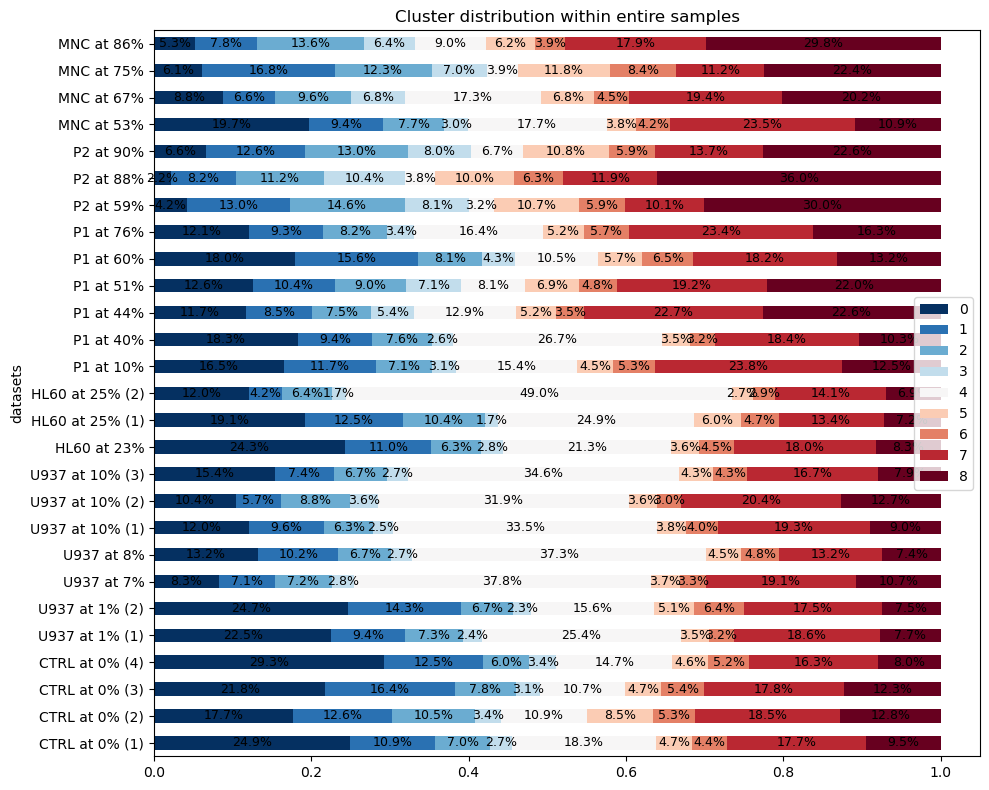

gmm_clusterplots/percentages_knee_9gmmclust.png


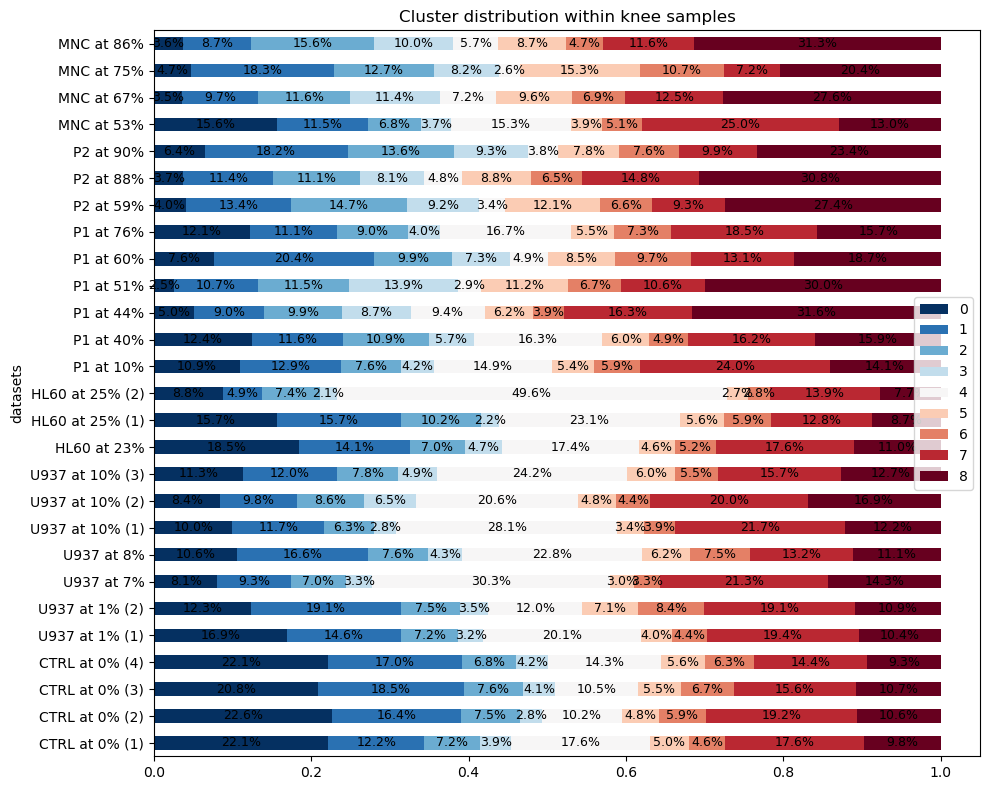

gmm_clusterplots/percentages_long_9gmmclust.png


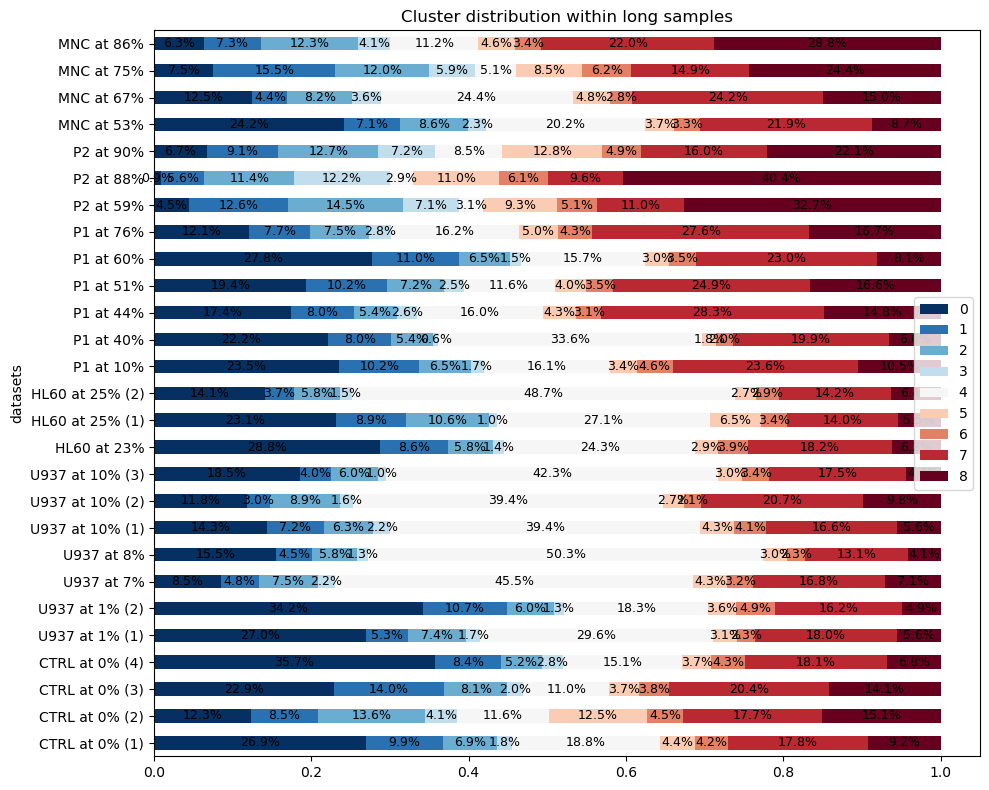

gmm_clusterplots/pca_knee_9gmmclust.png


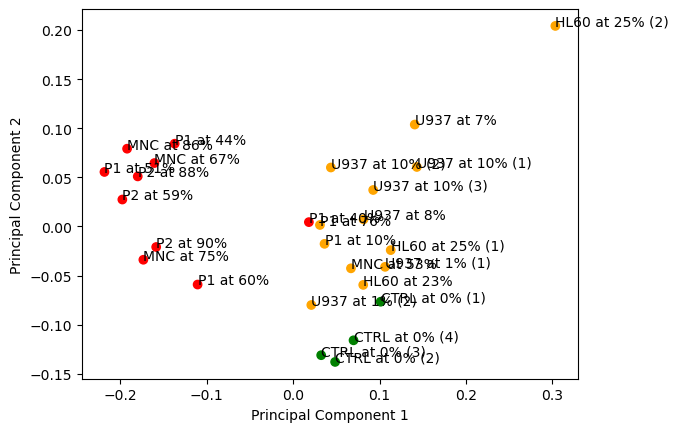

gmm_clusterplots/pca_knee_9gmmclust_withlegend.png


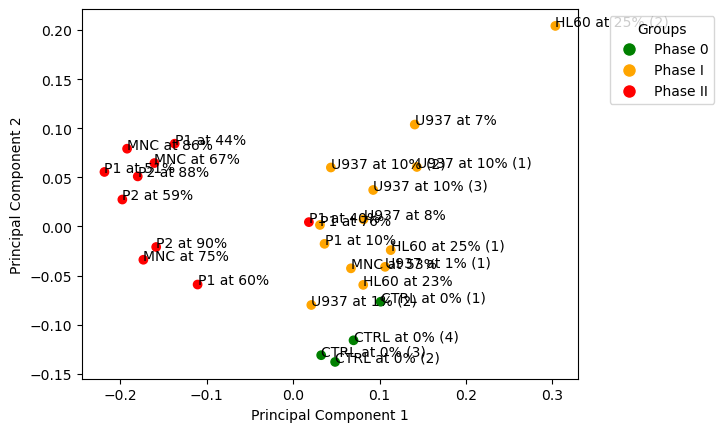

/var/tmp/pbs.8604430.pbs/ipykernel_3565953/1367108732.py:81: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("RdBu_r").copy()
  cmap_d.set_bad('yellow',.15)


gmm_clusterplots/clustermaps_knee_10gmmclust.png


In [ ]:
# print all the plots for all clustering
cluster_nums = [2,3,4,5,6,7,8,9,10]
for num in cluster_nums:
    n_clusters = num
    # load data
    name = "gmm_{}clusterlabels.csv".format(str(num))
    gmm_clusters = np.genfromtxt(name, delimiter=',')
    # set labels
    labels = np.zeros(n_tot)
    labels[nan_pixels == False]=gmm_clusters
    labels[nan_pixels == True] = np.nan
    
    labels_no_nan = labels[nan_pixels == False]
    unique_labels = np.unique(labels_no_nan)
    # set cmap
    cmap_d = set_cmap(num)
    
    # get visualisation
    Ni, Nj = 5,6

    ##anatomy = 'knee'

    bounds = np.arange(-.5, n_clusters)
    norm = matplotlib.colors.BoundaryNorm(bounds, cmap_d.N) 

    for anat in anat_list :

        if anat == 'knee' : fig, axes = plt.subplots(Ni, Nj, figsize = (Nj * 4, Ni * 2.5))
        if anat == 'long' : fig, axes = plt.subplots(Ni, Nj, figsize = (Nj * 4, Ni * 1.5))

        for d,dataset in enumerate(datasets_of_interest) :
            i,j = np.unravel_index(d, (Ni, Nj))
            ax = axes[i,j]
            ax.set_xlabel('{} {}'.format(anat, names_of_interest[d]))
            #print(dataset, injected) ##injected_datasets_of_interest[dataset])

            Y_map, X_map = dico_bonemap_sizes[dataset, anat]
            starting_index = ns * dico_starting_index[dataset, anat]
            excl_ending_index = ns * dico_excl_ending_index[dataset, anat]

            clustermaps = labels[starting_index : excl_ending_index].reshape(ns, Y_map, X_map)
            clustermap = clustermaps[slic]
            imsho = ax.imshow(clustermap.T, cmap = cmap_d , norm = norm)

            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="2%", pad=0.05)
            cbar = plt.colorbar(imsho, cax=cax, ticks=np.linspace(0,n_clusters - 1,n_clusters))
            if n_clusters == 3 : cbar.ax.set_yticklabels(['A','B','C'])

        for k in range(d+1, Ni * Nj) :
            i,j = np.unravel_index(k, (Ni, Nj))
            ax = axes[i,j]
            ax.axis('off')

        plt.tight_layout()
        #plt.subplots_adjust(wspace=1, hspace=0.1)

        figure_path = 'gmm_clusterplots/clustermaps_{}_{}gmmclust.png'.format(anat,n_clusters)
        print(figure_path) 
        plt.savefig(figure_path, dpi = 600) 
        plt.show()
        
    # get percentages
    STATS = {}
    if anatomy != 'both' :
        raise Exception('not applicable')

    count_clusters = {}
    total_per_dataset = {} # not adding nan pixels!

    for dataset in datasets_of_interest :
        anat = 'knee'
        starting_index = ns * dico_starting_index[dataset, anat]
        excl_ending_index = ns * dico_excl_ending_index[dataset, anat]
        clustermap_knee = labels[starting_index : excl_ending_index] # contains ns * Ymap * Xmap elements
        anat = 'long'
        starting_index = ns * dico_starting_index[dataset, anat]
        excl_ending_index = ns * dico_excl_ending_index[dataset, anat]
        clustermap_long = labels[starting_index : excl_ending_index] # contains ns * Ymap * Xmap elements

        total_per_dataset[dataset] = 0
        aux = 0
        for lab in unique_labels :
            aux = (clustermap_knee == lab).sum() + (clustermap_long == lab).sum()     
            count_clusters[dataset, lab] = aux
            total_per_dataset[dataset] += aux # not adding nan pixels!

    fig = plt.figure(figsize = (10,8))
    ax = plt.gca()

    stats_ = [ [ count_clusters[dataset, lab] for lab in unique_labels
               ] for dataset in datasets_of_interest ]

    for d,dataset in enumerate( datasets_of_interest):
        stats_[d] = stats_[d] / total_per_dataset[dataset]

    stats = np.array(stats_)

    STATS['both'] = stats

    dg = pd.DataFrame(stats_, paper_names_of_interest, list(map(int, unique_labels)))
    #dg = pd.DataFrame(stats, datasets_of_interest, list(map(int, unique_labels)))
    dg = dg.reset_index()
    dg.columns.values[0] = 'datasets'
    show_percentages(dg, 'entire', ax = ax, xlabel = 'datasets')

    plt.tight_layout()
    figpath = 'gmm_clusterplots/percentages_{}_{}gmmclust.png'.format('both',n_clusters)
    print(figpath)
    plt.savefig(figpath, dpi = 600)
    plt.show()
    
    for anat in anat_list :
        count_clusters = {}
        total_per_dataset = {} # not adding nan pixels!

        for dataset in datasets_of_interest :

            starting_index = ns * dico_starting_index[dataset, anat]
            excl_ending_index = ns * dico_excl_ending_index[dataset, anat]
            clustermaps = labels[starting_index : excl_ending_index] # contains ns * Ymap * Xmap elements

            total_per_dataset[dataset] = 0
            aux = 0
            for lab in unique_labels :
                aux = (clustermaps == lab).sum()     
                count_clusters[dataset, lab] = aux
                total_per_dataset[dataset] += aux # not adding nan pixels!

        fig = plt.figure(figsize = (10,8))
        ax = plt.gca()

        stats_ = [ [ count_clusters[dataset, lab] for lab in unique_labels
                        ] for dataset in datasets_of_interest ]

        for d,dataset in enumerate( datasets_of_interest):
            stats_[d] = stats_[d] / total_per_dataset[dataset]

        stats = np.array(stats_)
        STATS[anat] = stats

        dg = pd.DataFrame(stats_, paper_names_of_interest, list(map(int, unique_labels)))
        dg = dg.reset_index()
        dg.columns.values[0] = 'datasets'
        show_percentages(dg, anat, ax = ax, xlabel = 'datasets')

        plt.tight_layout()
        figpath = 'gmm_clusterplots/percentages_{}_{}gmmclust.png'.format(anat,n_clusters)
        print(figpath)
        plt.savefig(figpath, dpi = 600)
        plt.show()

    # Apply PCA
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(STATS["knee"])

    for i, txt in enumerate(paper_names_of_interest):
        plt.annotate(txt, (principal_components[i, 0], principal_components[i, 1]))

    # Plot the first two principal components
    plt.scatter(principal_components[:, 0], principal_components[:, 1], c=label_colours)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    figpath = 'gmm_clusterplots/pca_knee_{}gmmclust.png'.format(n_clusters)
    print(figpath)
    plt.savefig(figpath, dpi = 600)
    plt.show()
    
    # plot with legend
    classes = ["Phase 0", "Phase I", "Phase II"]
    colours = ["green", "orange", "red"]
    legend_labels = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=i, markersize=10) for i in colours]
    # Plot the first two principal components
    for i, txt in enumerate(paper_names_of_interest):
        plt.annotate(txt, (principal_components[i, 0], principal_components[i, 1]))
    plt.scatter(principal_components[:, 0], principal_components[:, 1], c=label_colours)
    #plt.title('PCA: First Two Principal Components')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(legend_labels, classes, title='Groups', bbox_to_anchor=(1.05, 1), loc='upper left')
    figpath = 'gmm_clusterplots/pca_knee_{}gmmclust_withlegend.png'.format(n_clusters)
    print(figpath)
    plt.savefig(figpath, dpi = 600)
    plt.show()

